In [5]:
import glob
import astropy
import importlib
import math
import numpy as np
import xlwt
import xlsxwriter
import warnings
warnings.filterwarnings('ignore')

from xlwt import Workbook
from reduct_funcs import funcs_calib_and_plot
from reduct_funcs import funcs_star_finder
from reduct_funcs import funcs_apt_phot
from reduct_funcs import funcs_utils

importlib.reload(funcs_calib_and_plot)
importlib.reload(funcs_star_finder)
importlib.reload(funcs_apt_phot)
importlib.reload(funcs_utils)

<module 'reduct_funcs.funcs_utils' from 'C:\\Users\\afiq-Astro\\Desktop\\TSSP\\reductions_3\\reduct_funcs\\funcs_utils.py'>

In [19]:
fp = 'C:/Users/afiq-Astro/Desktop/TSSP/reductions_3/files_sorted/2020-04-01/flat'
funcs_utils.make_dir(fp )

Inside dir: C:/Users/afiq-Astro/Desktop/TSSP/reductions_3/files_sorted/2020-04-01/flat 191 Things detected
Print without .gz 3: C:/Users/afiq-Astro/Desktop/TSSP/reductions_3/files_sorted/2020-04-01/flat\flatn-b5s0001.fits


In [2]:
MJD = '2020-03-05'

bias = glob.glob('./files_sorted/'+MJD+'/bias/*')
dark = glob.glob('./files_sorted/'+MJD+'/dark/*')
flat = glob.glob('./files_sorted/'+MJD+'/flat/*')
target = glob.glob('./files_sorted/'+MJD+'/ee_cep/*')
pol_std = glob.glob('./files_sorted/'+MJD+'/pol_std/*')

print("Bias:", str(len(bias))+".", 
      "Dark:", str(len(dark))+".", 
      "Flat:", str(len(flat))+".", 
      "Target:", str(len(target))+".", 
      "Polarization Standard:", str(len(pol_std))+".")

funcs_calib_and_plot.file_splits(bias)
funcs_calib_and_plot.file_splits(dark)
funcs_calib_and_plot.file_splits(flat)
funcs_calib_and_plot.file_splits(target)
funcs_calib_and_plot.file_splits(pol_std)

Bias: 50. Dark: 220. Flat: 24. Target: 180. Polarization Standard: 106.
zero {'bias'} Filters: [('SU', 50)] 
dark {'dark'} Filters: [('SU', 220)] 
flat {'flat'} Filters: [('R', 24)] 
object {'eecep'} Filters: [('P1-R', 51), ('P3-R', 51), ('R', 78)] total 30.0 min exposure time
object {'hd215806', 'g191b2b'} Filters: [('P1-R', 53), ('P3-R', 53)] total 27.0 min exposure time


In [3]:
m_biast, m_dark, m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, flat)
#Where do the R bands start?

In [10]:
funcs_utils.print_list(MJD, target)

2020-03-05
0 19:22:57.32 P1-R 15.0 eecep
1 19:23:50.03 P1-R 20.0 eecep
2 19:24:41.66 P1-R 20.0 eecep
3 19:25:33.32 P1-R 20.0 eecep
4 19:26:24.96 P1-R 20.0 eecep
5 19:27:16.56 P1-R 20.0 eecep
6 19:28:08.19 P1-R 20.0 eecep
7 19:28:59.82 P1-R 20.0 eecep
8 19:29:51.46 P1-R 20.0 eecep
9 19:30:43.11 P1-R 20.0 eecep
10 19:31:34.69 P1-R 20.0 eecep
11 19:32:26.31 P1-R 20.0 eecep
12 19:33:17.96 P1-R 20.0 eecep
13 19:34:09.59 P1-R 20.0 eecep
14 19:35:01.19 P1-R 20.0 eecep
15 19:35:52.81 P1-R 20.0 eecep
16 19:36:44.46 P1-R 20.0 eecep
17 19:37:36.10 P1-R 20.0 eecep
18 19:38:27.74 P1-R 20.0 eecep
19 19:39:19.31 P1-R 20.0 eecep
20 19:40:10.96 P1-R 20.0 eecep
21 19:41:02.59 P1-R 20.0 eecep
22 19:41:54.23 P1-R 20.0 eecep
23 19:42:45.82 P1-R 20.0 eecep
24 19:43:37.45 P1-R 20.0 eecep
25 19:44:29.10 P1-R 20.0 eecep
26 19:45:20.74 P1-R 20.0 eecep
27 19:46:12.37 P1-R 20.0 eecep
28 19:47:03.95 P1-R 20.0 eecep
29 19:47:55.58 P1-R 20.0 eecep
30 19:48:47.24 P1-R 20.0 eecep
31 19:15:44.27 P1-R 5.0 eecep
32 19:16

In [ ]:
#Question, what else is a zero polarization standard star

#zeroeing is important

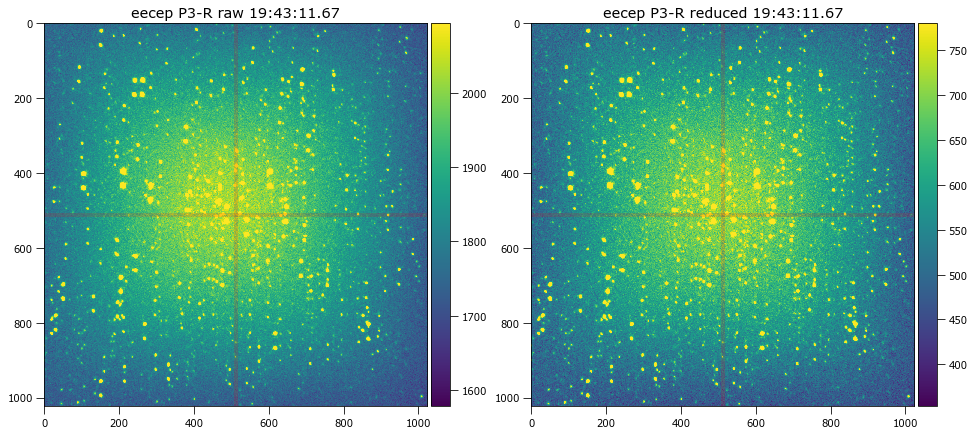

<Figure size 1008x1008 with 0 Axes>

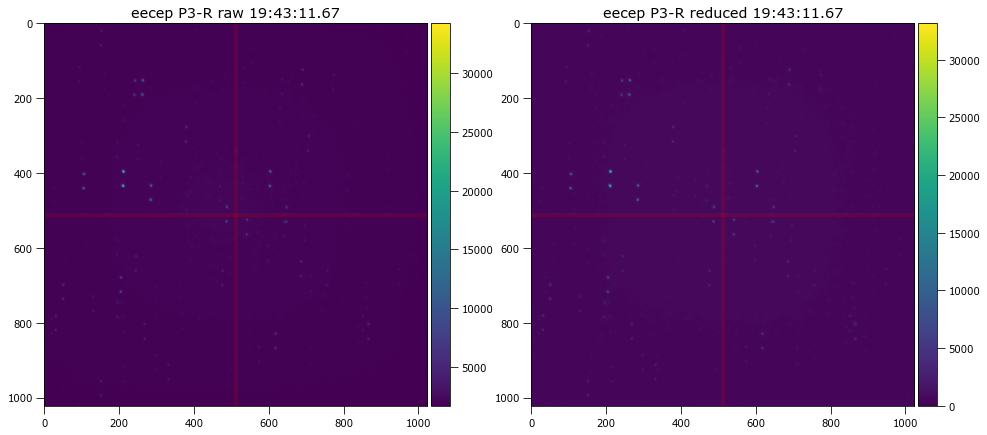

<Figure size 1008x1008 with 0 Axes>

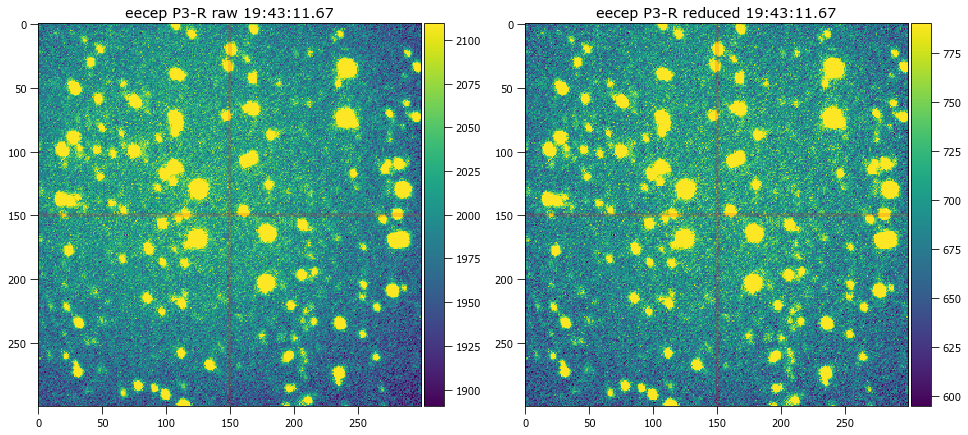

<Figure size 1008x1008 with 0 Axes>

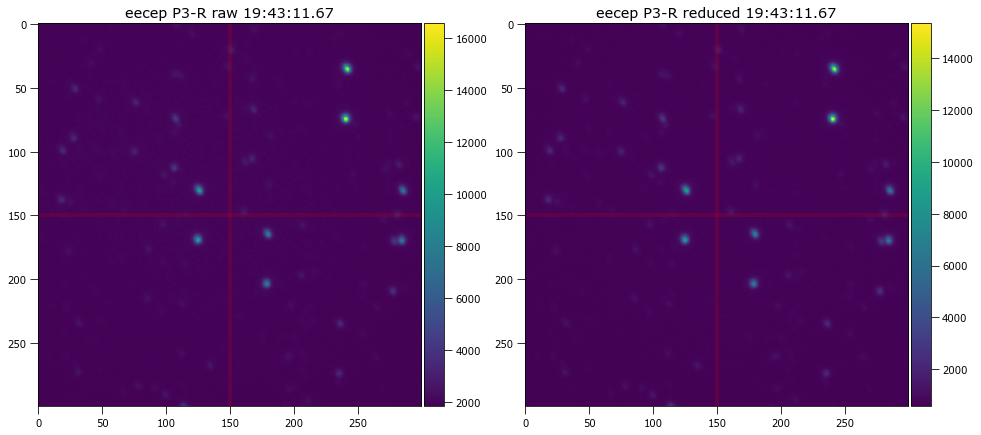

<Figure size 1008x1008 with 0 Axes>

In [20]:
#37 #40 #42
#If target not detected by DAO, use the location of the peak finder...
#your pipeline is macklunky
target_n=74

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True) 

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    False, True, True) 

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 150, 150], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True) 

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 150, 150], 
                                    (m_biast, m_dark, m_flat),
                                    False, True, True) 

In [ ]:
#I'm looking at the pol std star through a p1 - r filter

266 peaks detected from image of size 1024 x 1024 with sigma: 7 and threshold: 4117.094127118748 valid
Targets within region of interest:  4


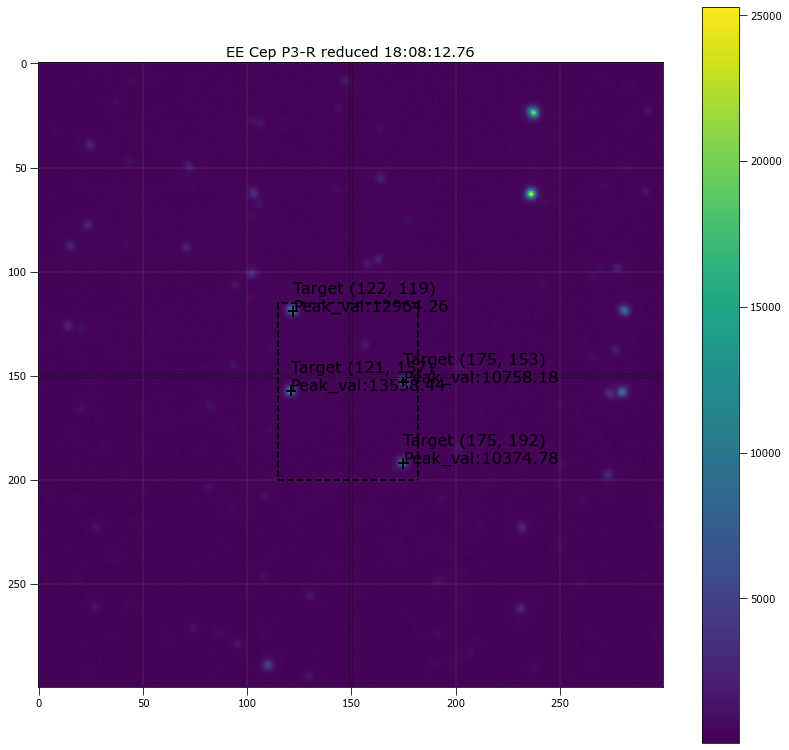

Aperture positions are: [(484, 481), (537, 515), (483, 519), (537, 554)] from the 1024 x 1024 image
Aperture positions are: [(122, 119), (175, 153), (121, 157), (175, 192)] from the 150 x 150 image


In [19]:
search_off = 150
search_bracket = [35, 50, 35, 32]
x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj,7,search_bracket, 3000 , False, True) #what do I return from this?
apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket,x_targ, y_targ, peak_targ, True, False)

apt_positions = []
for h in range(0 , len(x_targ)):
    apt_positions.append((x_targ[h], y_targ[h])) #This must undergo some translation    
    
print("Aperture positions are:", apt_positions, "from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print("Aperture positions are:", apt_pos, "from the", str(search_off), "x", str(search_off) ,"image")

94 peaks detected from image of size 1024 x 1024 with sigma: 7 and threshold: 4128.73902460293 valid
Targets within region of interest:  4


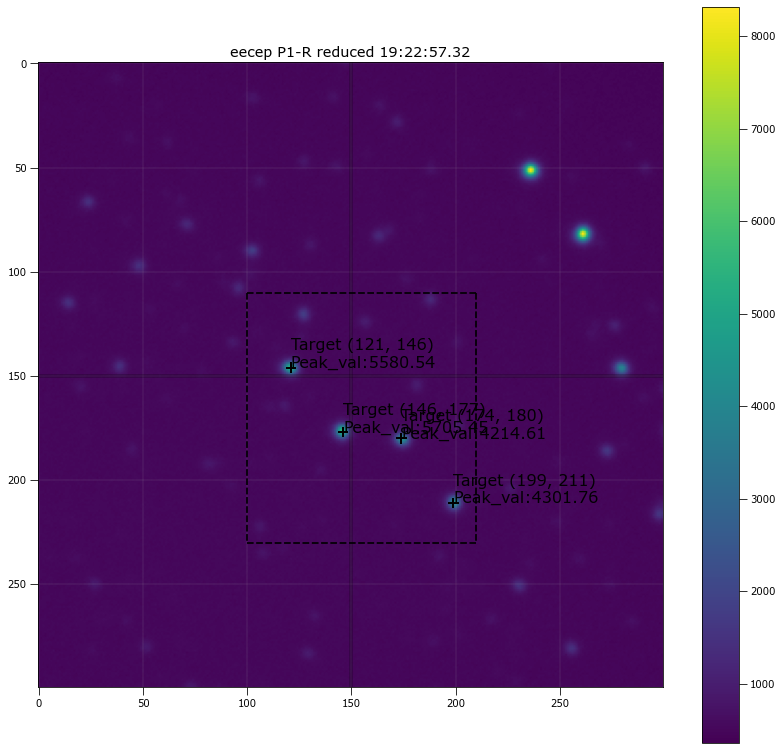

Aperture positions are: [(483, 508), (508, 539), (536, 542), (561, 573)] from the 1024 x 1024 image
Aperture positions are: [(121, 146), (146, 177), (174, 180), (199, 211)] from the 150 x 150 image


In [13]:
search_off = 150
search_bracket = [30, 80, 50, 60]
x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj,7,search_bracket, 3000 , False, True) #what do I return from this?
apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket,x_targ, y_targ, peak_targ, True)

apt_positions = []
for h in range(0 , len(x_targ)):
    apt_positions.append((x_targ[h], y_targ[h])) #This must undergo some translation    
    
print("Aperture positions are:", apt_positions, "from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print("Aperture positions are:", apt_pos, "from the", str(search_off), "x", str(search_off) ,"image")

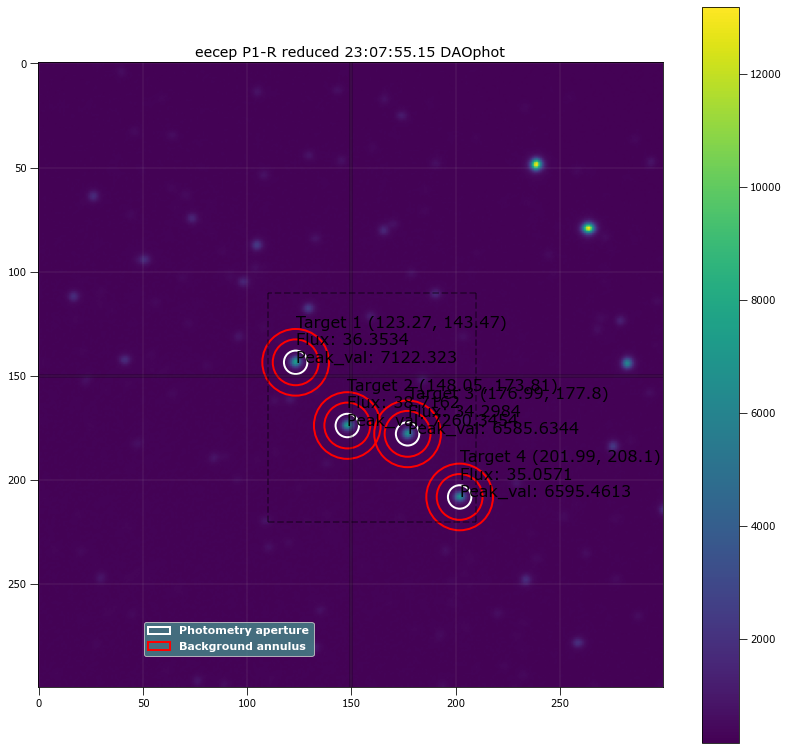

In [56]:
#DAO star finder
siegma_search = 3
DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2000, 150, 5.62, 11 , 16, True, False) #siegma and offset
#print("Positions of aperture from DAO",DAO_positions, "within the region of interest")
#phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 100, DAO_positions,  5.62, 11 , 17, False  )

In [57]:
#Its like an injection, make the output of the first star finder equal to the input of DAO starfinder

print("Results of the First Star Finder:")
print(apt_positions, "aperture positions from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print(apt_pos, "aperture positions from the", str(search_off), "x", str(search_off) ,"image")
print("\n")
print([list(x) for x in  DAO_positions], "\naperture positions from DAO positions")

Results of the First Star Finder:
[(485, 505), (510, 536), (539, 540), (564, 570)] aperture positions from the 1024 x 1024 image
[(123, 143), (148, 174), (177, 178), (202, 208)] aperture positions from the 150 x 150 image


[[123.2675201532751, 143.46627533197469], [148.05382209073528, 173.80566469317804], [176.99192622479873, 177.80284871966387], [201.98723047621854, 208.09942845425388]] 
aperture positions from DAO positions


Good radii: 4.559322033898305


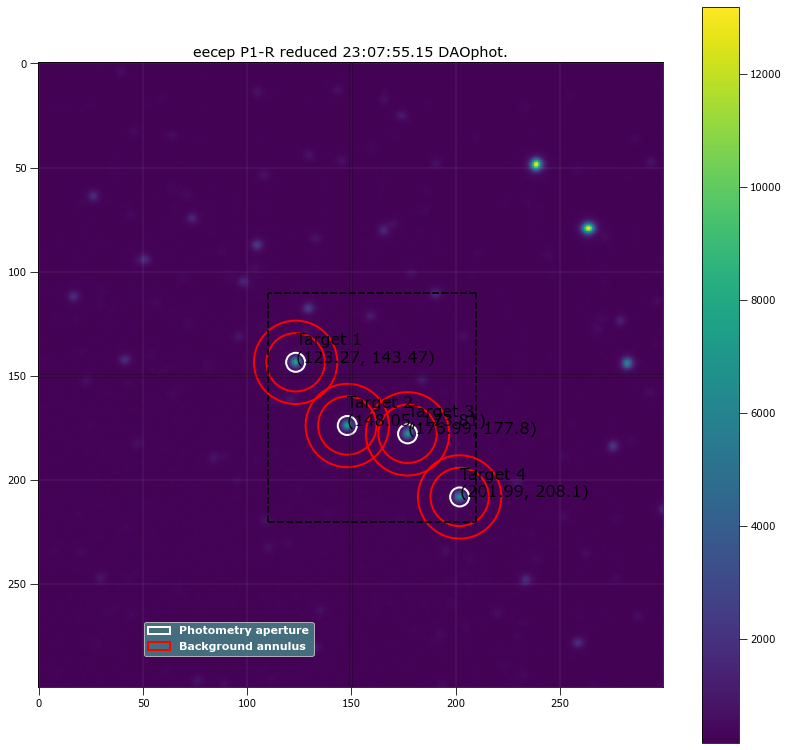

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 123.26752 143.46628 ...          2367.7118      182906.52          750.76198
  2 148.05382 173.80566 ...          2370.4181      165023.63          654.95787
  3 176.99193 177.80285 ...          2113.8525         162437          643.42809
  4 201.98723 208.09943 ...          2103.9078      165107.25          654.94492

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 123.26752 143.46628 ...                 2291.2098             131098.74
  2 148.05382 173.80566 ...                 2303.6785        

In [59]:
trial_radii = np.linspace(3.0, 7, num=60) #tries different radii
target_a = []
target_b = []
target_c = []
target_d = []

for radii in trial_radii:
    #Its this loop thats taking up the compute time
    DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2500, 150, 5.62, 11 , 16, False, False) 
    
    #print("DAO positions original:", len(DAO_positions) )
    
    if (len(DAO_positions) != 4):
        DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)
    
    #print("New DAO positions:", len(DAO_positions))
    
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150,search_bracket , DAO_positions, radii, 14 , 20, False,False)
    target_a.append(phot_tab['residual_aperture_sum'][0])
    target_b.append(phot_tab['residual_aperture_sum'][1])
    target_c.append(phot_tab['residual_aperture_sum'][2])
    target_d.append(phot_tab['residual_aperture_sum'][3])
    
combine_target = [target_a, target_b, target_c, target_d]

good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

print("Good radii:",good_radii)

phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150, search_bracket ,DAO_positions,good_radii, 14 , 20, True, False)

In [ ]:
#write an exception. If it cannot find anything. Then reduce the siegma. Or better yet just go for another set of coordinates

#1 and 4, 2 and 3

P1-R Filter
Aperture radius for 18:05:12.38 is 4.491525423728813


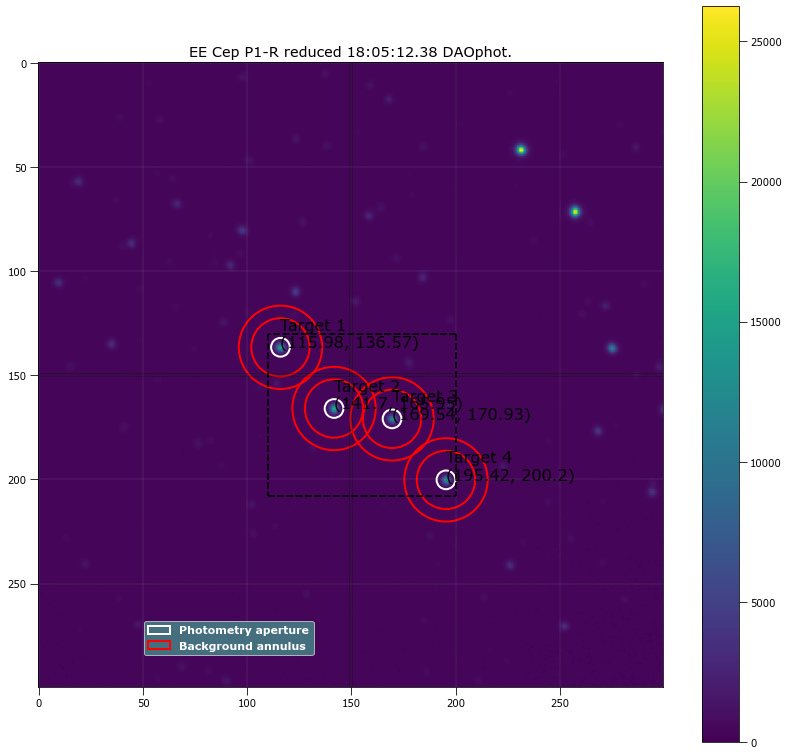

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.97701 136.57051 ...          3975.3975      255525.18          1064.1376
  2 141.69548 165.95452 ...          4136.5868      226268.74          897.01889
  3 169.53733 170.92786 ...           3270.078      224687.58          889.38411
  4 195.42212 200.20168 ...           3324.701         223118          884.21301

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.97701 136.57051 ...                 3870.1636             198732.68
  2 141.69548 165.95452 ...                 4047.8795        

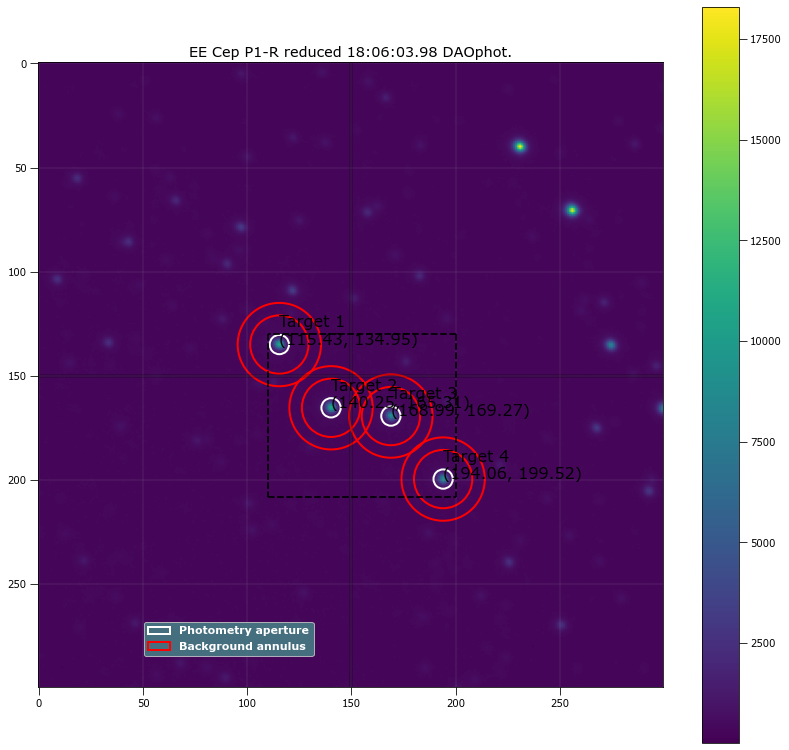

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.43412  134.9462 ...          3354.0491      253410.13          1032.2384
  2 140.25495 165.30701 ...          3424.1549      231060.74          915.58633
  3  168.9888    169.27 ...          2771.4823      228316.71           903.5903
  4  194.0642 199.51648 ...          2729.3993       231937.8           918.8583

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.43412  134.9462 ...                 3245.7135             187755.88
  2 140.25495 165.30701 ...                 3328.0622        

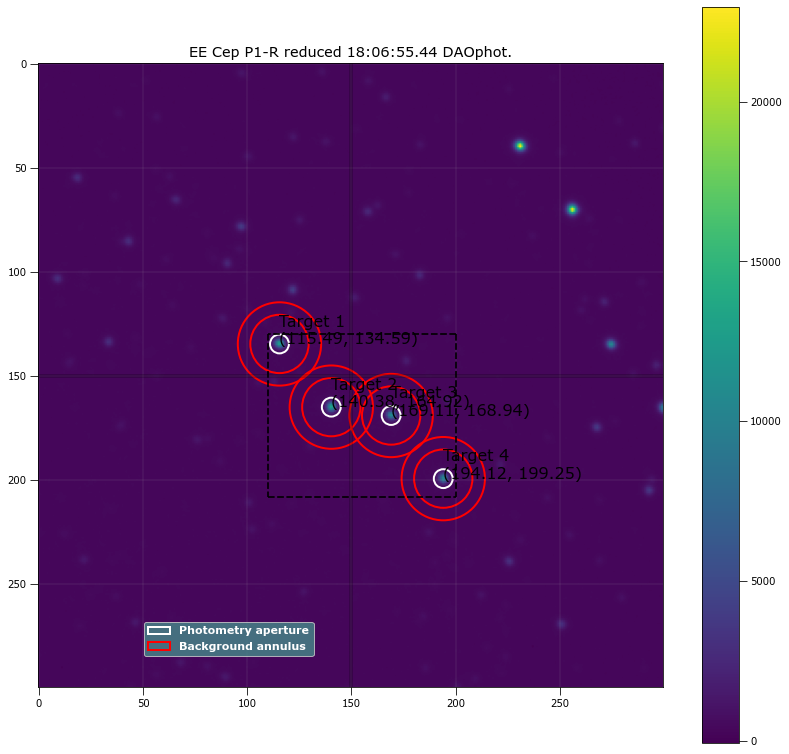

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.49421 134.59414 ...          3719.1925      252620.57          1041.2792
  2 140.37562 164.92251 ...          3815.4546      229659.86          910.32812
  3 169.10853 168.93792 ...          3082.1063      227118.44          898.82306
  4 194.12076 199.25156 ...          3062.4772      231451.31           917.0378

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.49421 134.59414 ...                  3614.659             194186.66
  2 140.37562 164.92251 ...                 3724.0672        

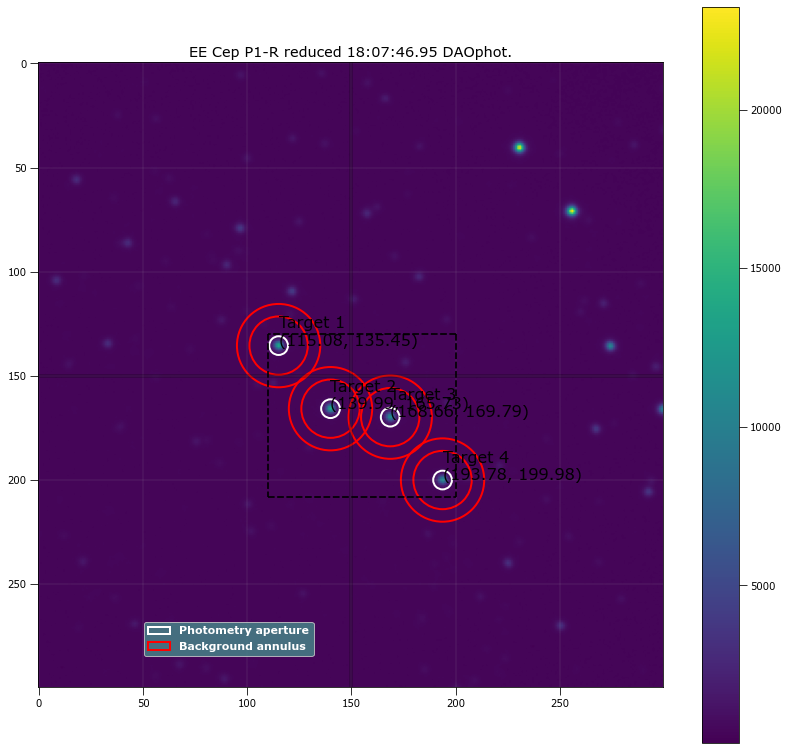

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.08357 135.45073 ...          3822.3946      252813.92           1042.765
  2 139.99212 165.73198 ...          3880.4984       228611.5          905.96744
  3 168.65917 169.79412 ...           3181.957      226076.72           894.6801
  4 193.78025 199.97762 ...          3140.1749      230352.41          912.87963

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.08357 135.45073 ...                 3719.2743             195192.48
  2 139.99212 165.73198 ...                 3790.9062        

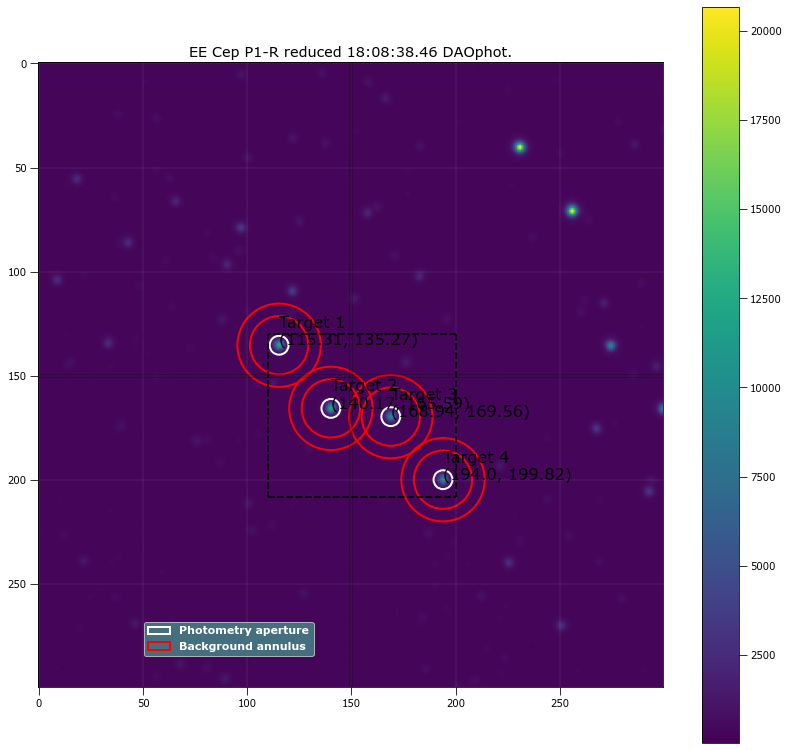

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.31365 135.27389 ...          3554.5744      250375.87          1027.2391
  2 140.17047 165.58646 ...          3665.5091      227224.07          900.92795
  3 168.93661 169.56376 ...           2915.467      225129.86          891.06042
  4 193.99731 199.81786 ...          2896.5855       228752.2          906.46386

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.31365 135.27389 ...                 3451.4504             190809.62
  2 140.17047 165.58646 ...                 3575.0654        

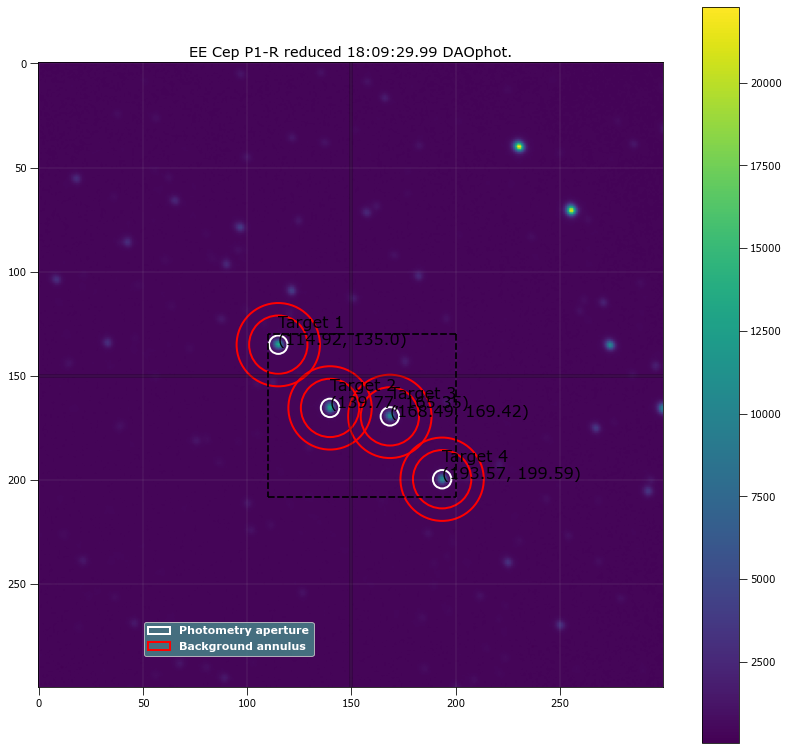

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.92323 135.00202 ...           3788.337       249116.3          1027.7831
  2 139.77127  165.3523 ...          3871.2739      225390.52          893.73815
  3 168.49265 169.42371 ...          3096.7911      223067.71          882.79802
  4 193.57439 199.59221 ...          3098.7539      226761.33          898.67535

 Aperture are: 61.47900981189034 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.92323 135.00202 ...                 3689.7435             195544.78
  2 139.77127  165.3523 ...                 3785.5391        

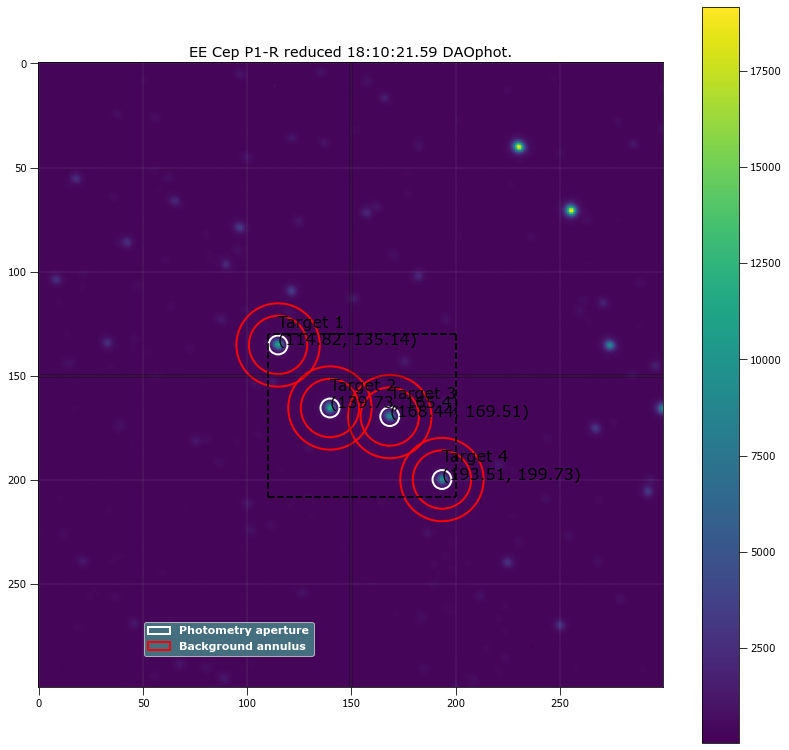

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.81901  135.1443 ...          3510.5371      248532.55          1021.9861
  2 139.73109 165.39769 ...          3607.0066      225511.37          893.80044
  3 168.44438 169.51338 ...          2903.4678      222912.85          882.31538
  4 193.50582 199.73463 ...          2904.5612      225373.71          892.97317

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.81901  135.1443 ...                 3407.9404             189067.27
  2 139.73109 165.39769 ...                 3517.2784        

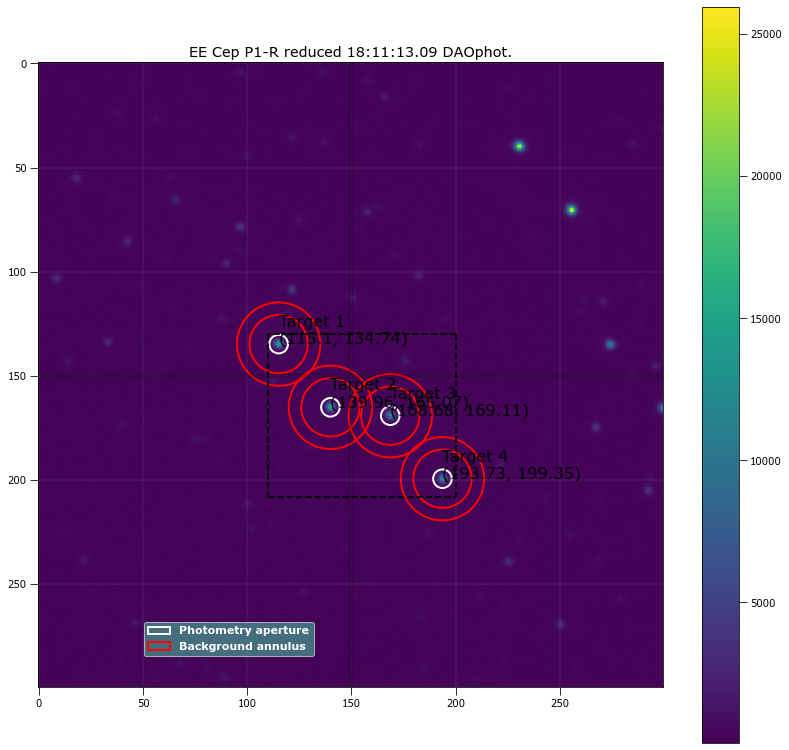

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.10323 134.73512 ...          3947.5358      247400.63           1030.436
  2 139.95687 165.06838 ...          4109.6664      224276.39          889.11948
  3 168.68447 169.11414 ...          3306.4634      222243.64          879.69754
  4 193.73321 199.34765 ...          3289.9233      225863.55          895.53496

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.10323 134.73512 ...                 3847.1671             194986.91
  2 139.95687 165.06838 ...                 4023.0625        

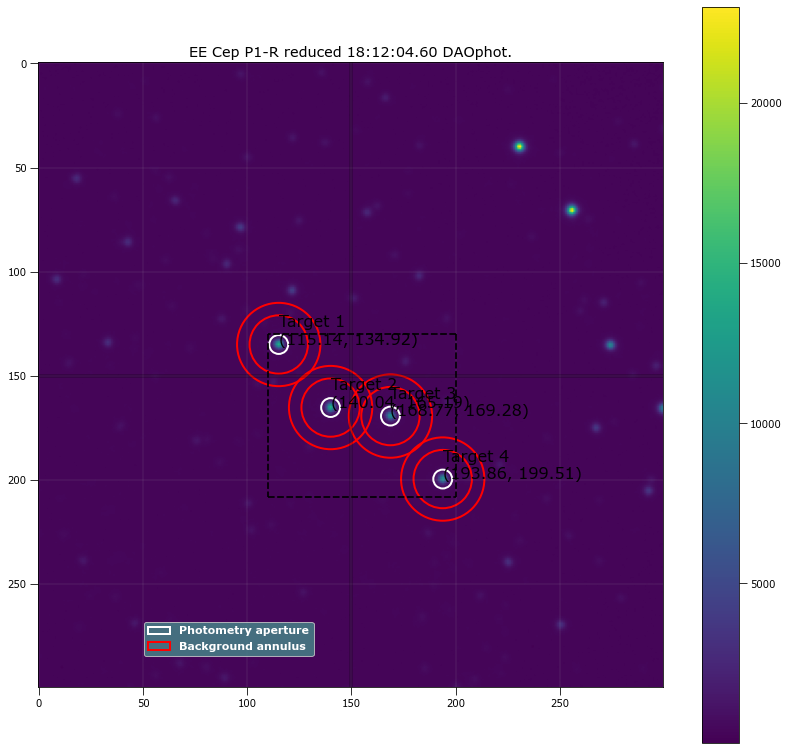

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.13769 134.91628 ...          3808.5308      247497.78          1022.8985
  2  140.0373 165.18649 ...           3914.416      224560.05          890.01223
  3 168.76828 169.27739 ...          3170.9014      222621.13          881.09651
  4  193.8623 199.50783 ...          3182.8992      226134.87           896.1873

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.13769 134.91628 ...                 3705.8425             195371.54
  2  140.0373 165.18649 ...                 3825.0681        

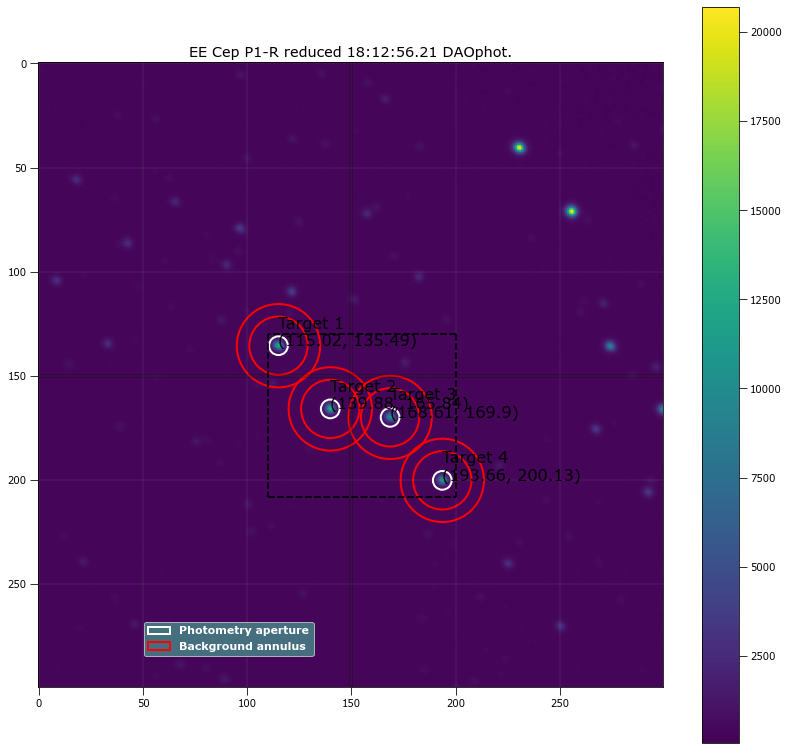

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1  115.0157 135.49267 ...          3600.8597      247986.91          1021.0005
  2 139.88078 165.83836 ...          3695.1563      225437.14          893.51033
  3 168.60616 169.89501 ...          3023.9176      223509.23          884.49404
  4 193.65697 200.13426 ...          3033.3029      225831.46          895.21178

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1  115.0157 135.49267 ...                 3499.8917             189070.29
  2 139.88078 165.83836 ...                  3606.796        

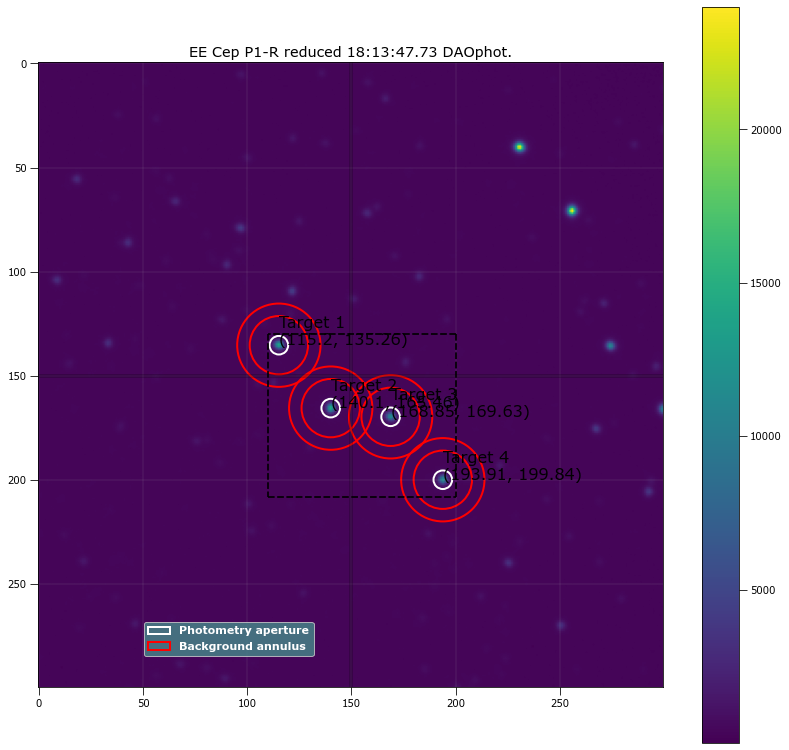

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 115.20047 135.25911 ...          3806.8694      248655.64          1029.9537
  2 140.09684 165.45752 ...          3926.8555      225126.81          892.26067
  3 168.85075 169.62669 ...          3165.3462      223900.15          886.11212
  4 193.90683 199.84045 ...           3171.372      227091.93          900.13946

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 115.20047 135.25911 ...                 3706.5477             191697.34
  2 140.09684 165.45752 ...                 3839.9456        

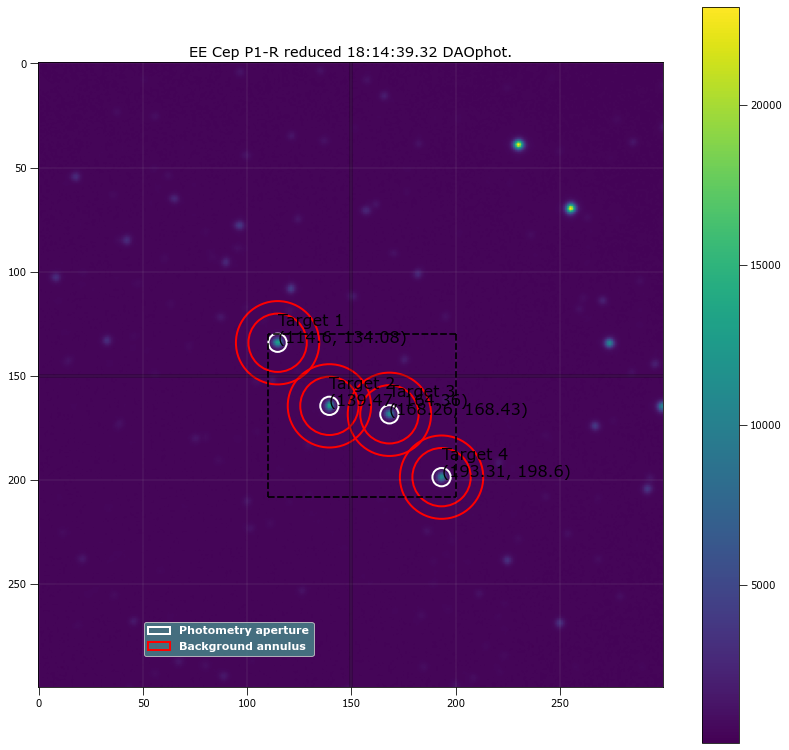

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.59668 134.07542 ...          3739.0175      247109.17          1022.8905
  2 139.46878 164.36271 ...          3876.1823      224826.24          891.19371
  3 168.26267 168.42748 ...          3151.1755      223363.81          883.88001
  4 193.30516 198.59955 ...          3164.9372      226102.06          896.08106

 Aperture are: 60.54041275365036 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.59668 134.07542 ...                 3642.3914             190568.16
  2 139.46878 164.36271 ...                 3791.9968        

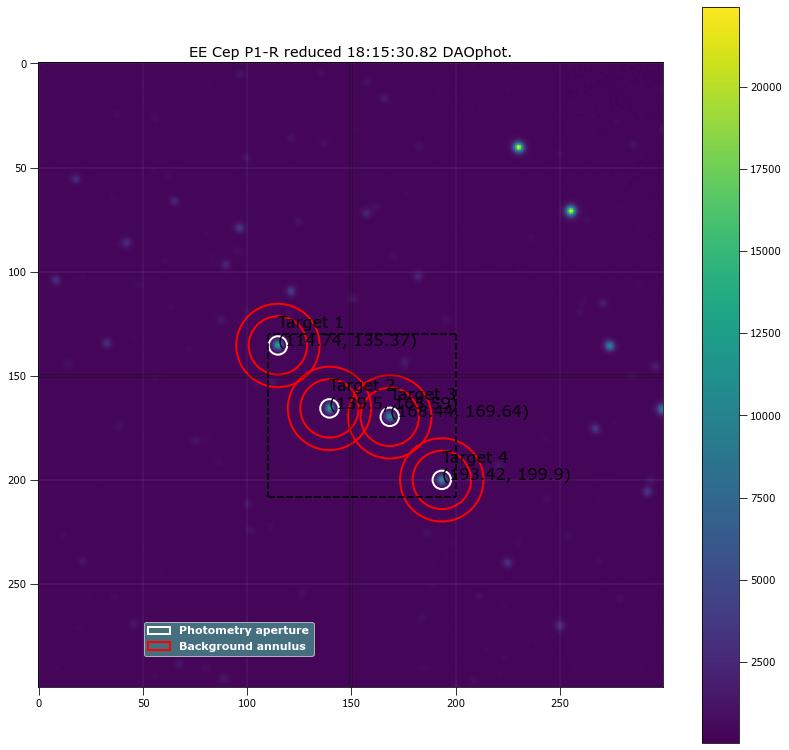

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.74482 135.36603 ...          3707.3116      247579.02          1020.6034
  2 139.50077 165.59255 ...          3757.2307      226616.69          898.17471
  3 168.44118 169.64465 ...          3100.2808      223764.91          885.56942
  4 193.42017 199.90325 ...          3055.5579      227831.46          903.17462

 Aperture are: 61.47900981189034 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.74482 135.36603 ...                 3609.4068             188015.56
  2 139.50077 165.59255 ...                 3671.0703        

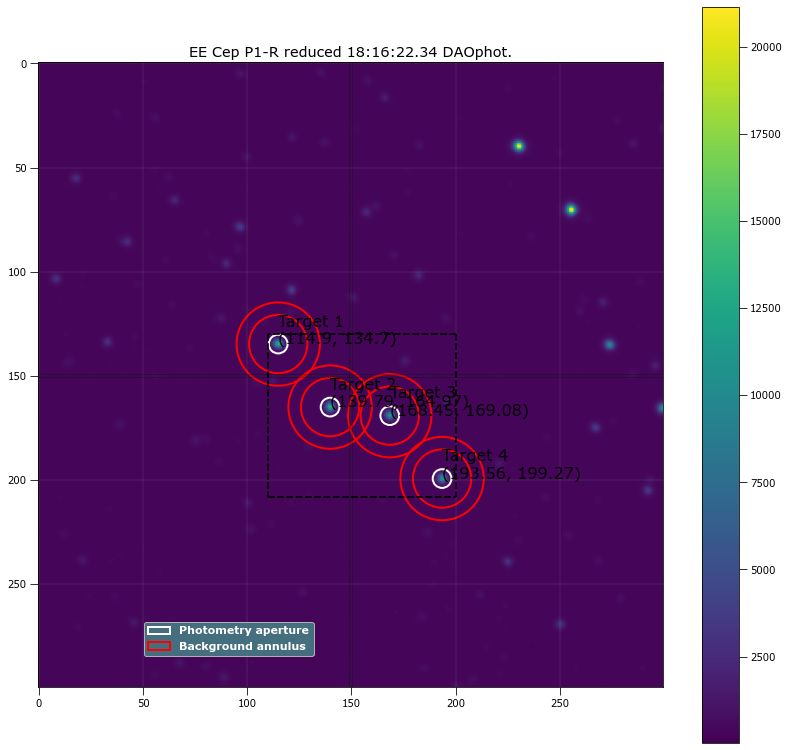

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.89825 134.70198 ...          3655.8907      249378.83           1028.742
  2  139.7871 164.96644 ...          3744.0722      226922.49          899.51289
  3 168.44691 169.07542 ...          3007.5037      225144.87          890.86168
  4  193.5559 199.26633 ...          3020.6881      228297.85          904.84715

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.89825 134.70198 ...                 3554.1572             188541.49
  2  139.7871 164.96644 ...                 3655.1183        

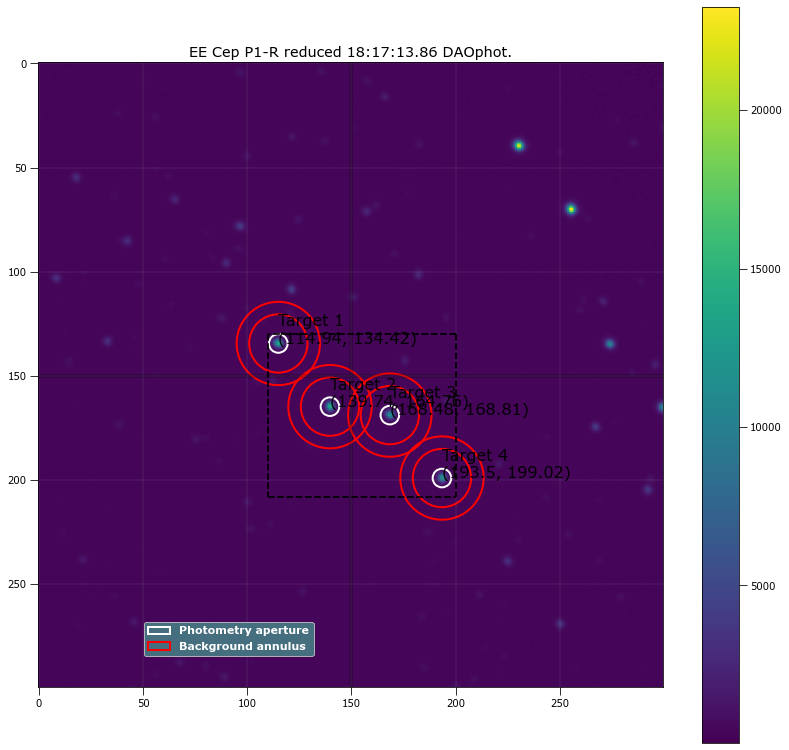

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.94498  134.4243 ...          3803.7607      252341.46          1046.6024
  2 139.74331 164.75841 ...          3935.1348      230376.46          912.93538
  3 168.48249 168.81495 ...          3196.0786      228547.34          904.58791
  4  193.4972 199.02336 ...          3224.6991      231123.85          916.03534

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.94498  134.4243 ...                 3701.8174             187047.55
  2 139.74331 164.75841 ...                 3846.2112        

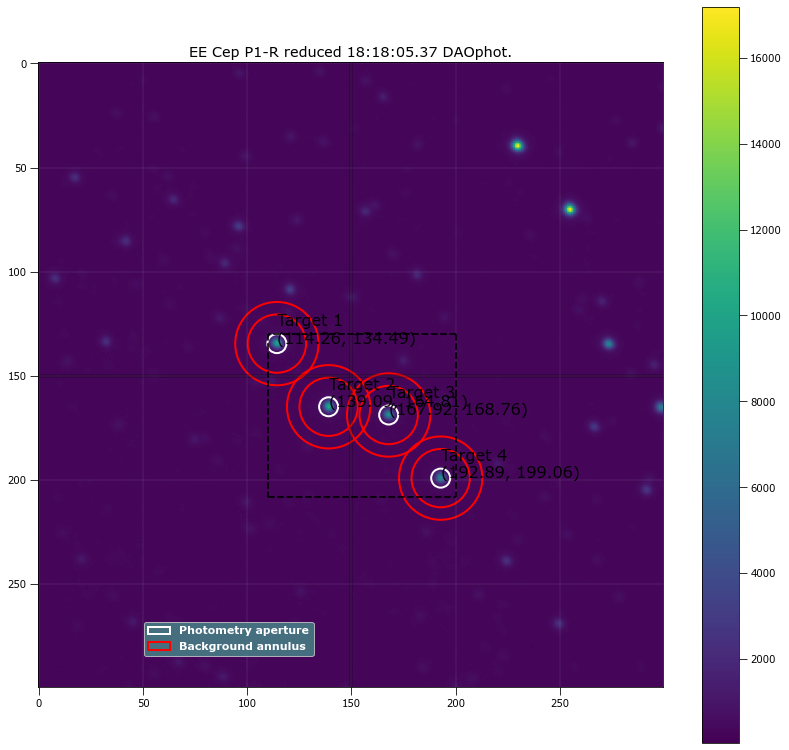

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.25569 134.49271 ...          3202.7296      252510.44          1029.6942
  2 139.09193 164.81029 ...          3267.6958      231555.19          917.42219
  3 167.91559 168.76074 ...          2646.4124      228742.01          905.17658
  4 192.88887 199.05862 ...          2613.3788      232813.86          922.34947

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.25569 134.49271 ...                 3097.8047             176776.55
  2 139.09193 164.81029 ...                 3174.2113        

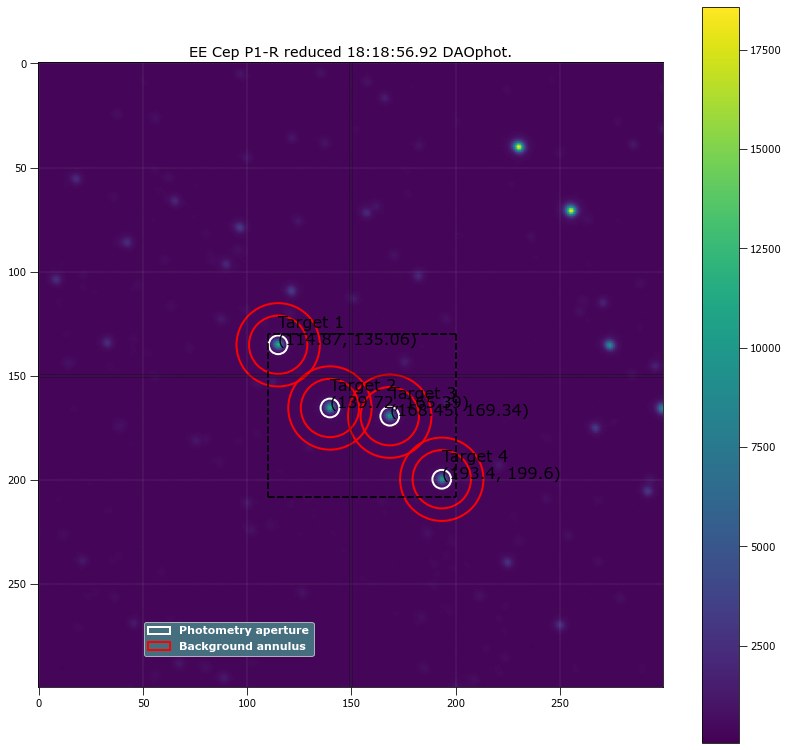

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.86823 135.06229 ...          3336.4659      254063.62          1036.1887
  2 139.72468 165.39169 ...          3351.3271      233112.47          923.52721
  3 168.44736 169.33995 ...           2810.388      230743.77          913.14874
  4 193.40033 199.59934 ...          2789.5039      233746.92          926.10136

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.86823 135.06229 ...                  3233.996             176756.79
  2 139.72468 165.39169 ...                 3259.9984        

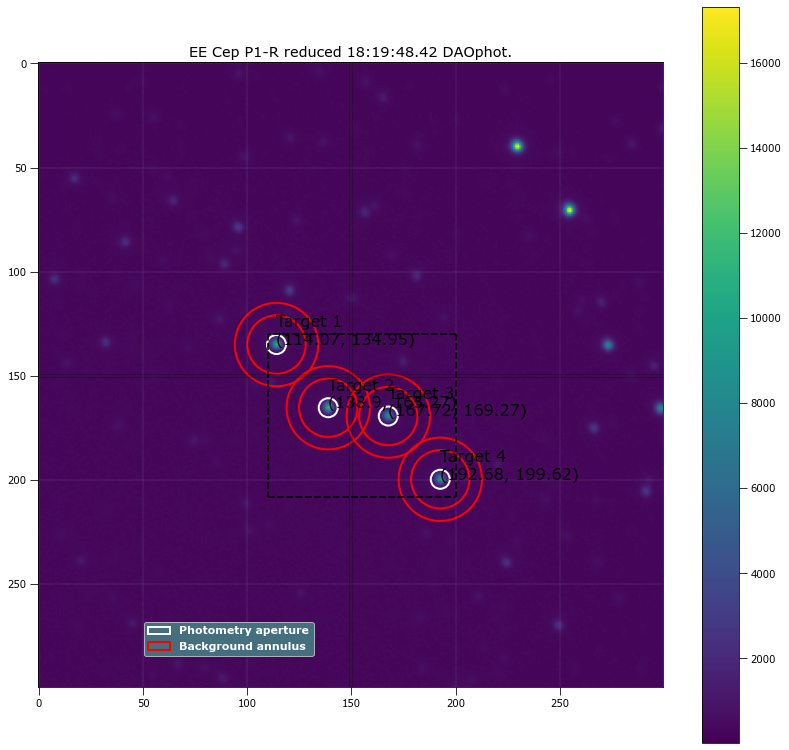

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.06547 134.94723 ...          3218.7952      252796.83          1028.8367
  2 138.89557 165.27129 ...          3314.0074      232085.36          919.66235
  3 167.71759 169.27228 ...          2674.8122      229511.96          908.19941
  4 192.68133 199.62081 ...          2685.2634      233818.38          926.01393

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.06547 134.94723 ...                 3113.9576             177671.57
  2 138.89557 165.27129 ...                 3220.2946        

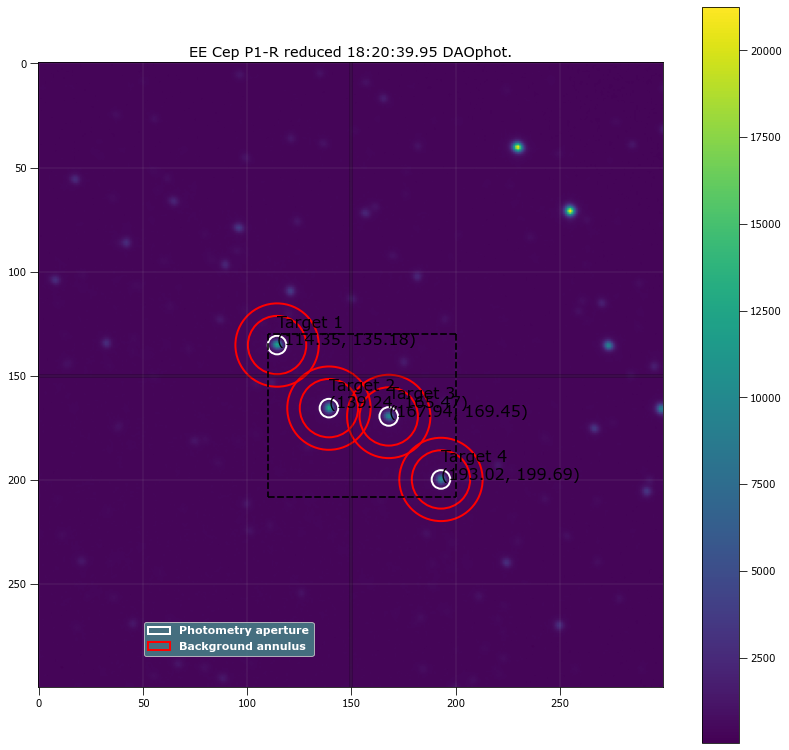

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.34709 135.18336 ...          3554.1439      254814.12          1043.9592
  2 139.24382 165.46508 ...          3632.0105      233261.39          924.25648
  3 167.94309 169.45199 ...          2902.1874      230116.38          910.65865
  4 193.02145 199.69095 ...          2892.5894      233626.01          925.56824

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.34709 135.18336 ...                  3452.458              183686.7
  2 139.24382 165.46508 ...                 3541.9842        

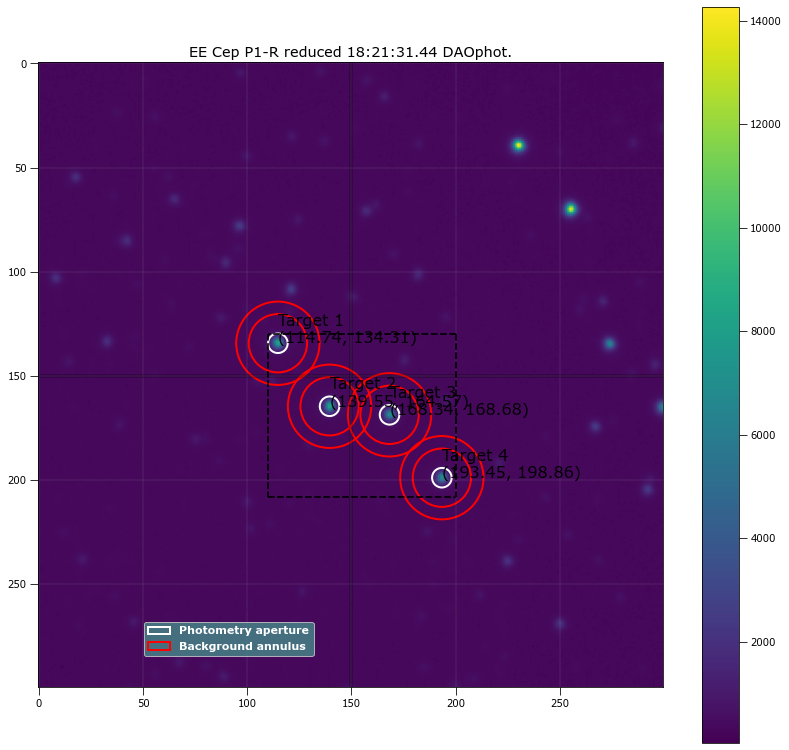

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 114.74001 134.31369 ...          2886.2302       249248.3          1007.9191
  2 139.54614  164.5743 ...          2931.0001      230997.56          915.07536
  3 168.33927 168.67735 ...          2424.5706      228599.95          904.72608
  4  193.4498 198.86364 ...          2406.3025      230398.17          912.41128

 Aperture are: 69.24770546316898 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 114.74001 134.31369 ...                 2777.3244             169607.27
  2 139.54614  164.5743 ...                 2832.1261        

In [12]:
#The pipe!
#we expect 4 targets
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.

print("P1-R Filter")

res_apt_sum_list = []

start = 19
end = 39
filename = astropy.io.fits.open(target[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(target[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'target 1 x center')
worksheet.write('F1', 'target 1 y center')
worksheet.write('G1', 'target 1 counts')
worksheet.write('H1', 'target 1 error')
worksheet.write('I1', 'target 2 x center')
worksheet.write('J1', 'target 2 y center')
worksheet.write('K1', 'target 2 counts')
worksheet.write('L1', 'target 2 error')
worksheet.write('M1', 'target 3 x center')
worksheet.write('N1', 'target 3 y center')
worksheet.write('O1', 'target 3 counts')
worksheet.write('P1', 'target 3 error')
worksheet.write('Q1', 'target 4 x center')
worksheet.write('R1', 'target 4 y center')
worksheet.write('S1', 'target 4 counts')
worksheet.write('T1', 'target 4 error')
worksheet.write('U1', 'q')
worksheet.write('V1', 'q error')
worksheet.write('W1', 'u')
worksheet.write('X1', 'u error')
worksheet.write('Y1', 'PD')
worksheet.write('Z1', 'PD error')
worksheet.write('AA1', 'PA')
worksheet.write('AB1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [20, 58, 40, 50]

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(3.0, 7, num=60)
    target_a = []
    target_b = []
    target_c = []
    target_d = []
    for radii in trial_radii:
        #Find the position
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          2200, search_off, radii, 14 , 20, False, False)
        
        if (len(DAO_positions) != 4):
            x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj, 4,search_bracket, 800 , False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        #Insert Trial
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        target_a.append(phot_tab['residual_aperture_sum'][0])
        target_b.append(phot_tab['residual_aperture_sum'][1])
        target_c.append(phot_tab['residual_aperture_sum'][2])
        target_d.append(phot_tab['residual_aperture_sum'][3])

    combine_target = [target_a, target_b, target_c, target_d]
    
    good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 14 , 20, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3], "\n")
    
    write_this = [k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3]   ]

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

target_1 = []
target_2 = []
target_3 = []
target_4 = []

for things in res_apt_sum_list:
    target_1.append(things[0])
    target_2.append(things[1])
    target_3.append(things[2])
    target_4.append(things[3])

In [ ]:
#You have to do a manual Fit before you do a physical fit.
print("Hello")

In [ ]:
#Now I am seeing a case where with the threshold lowered, long compute time I am picking up unwanted background sources
#I'm looking at the example from P1-R
#Target_1

#The pipe!
#we expect 4 targets
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.

P3-R Filter
Aperture radius for 18:33:41.91 is 4.423728813559322


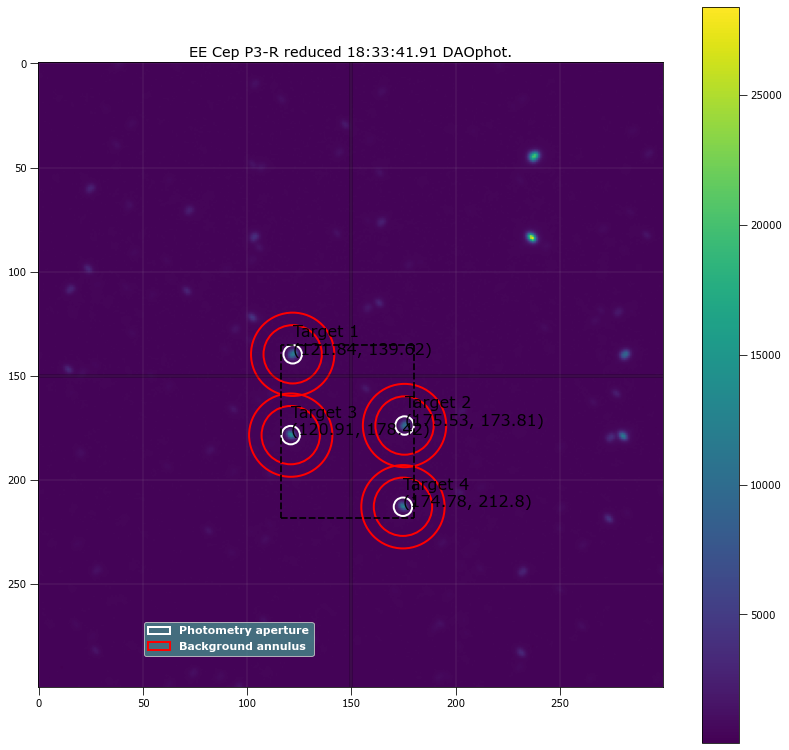

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.83815  139.6186 ...          3457.9851      237161.73          940.13775
  2 175.53261 173.81151 ...          3034.1277       235210.2          930.91899
  3 120.90512 178.41964 ...          3601.0902      235484.43          933.09991
  4 174.77749 212.80497 ...          3161.8681      230959.39          914.15942

 Aperture are: 61.47900981189034 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.83815  139.6186 ...                 3367.7993             173104.61
  2 175.53261 173.81151 ...                 2944.8262        

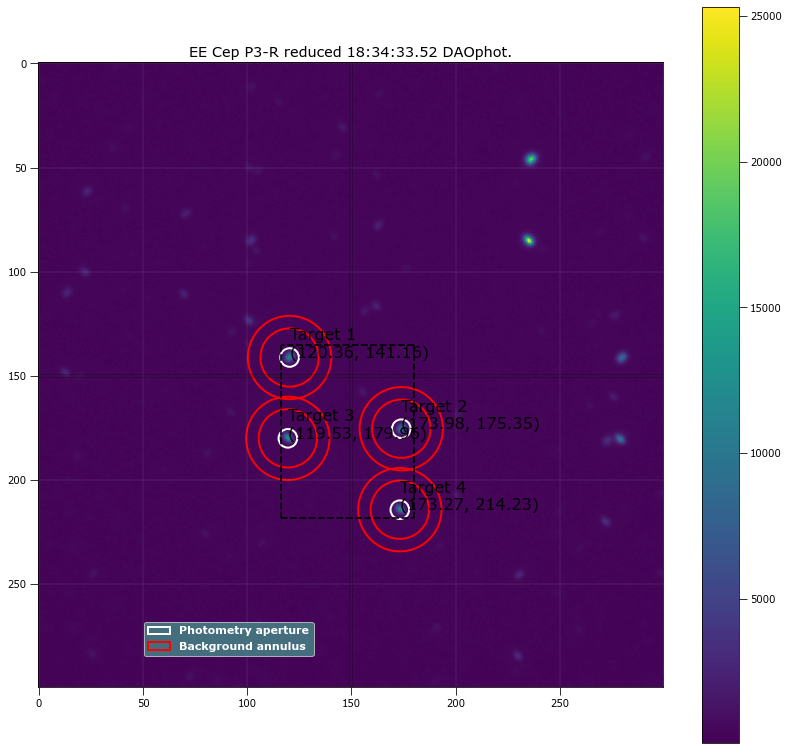

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.35727 141.16259 ...          3283.4022      237226.37          941.02835
  2 173.97542 175.34607 ...          2922.3811      234454.81          927.95719
  3 119.52691 179.95815 ...          3385.2295      235921.42          934.78282
  4 173.26653 214.22788 ...          3024.5381      230565.82          912.56028

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.35727 141.16259 ...                 3191.7422             169730.94
  2 173.97542 175.34607 ...                 2831.9942        

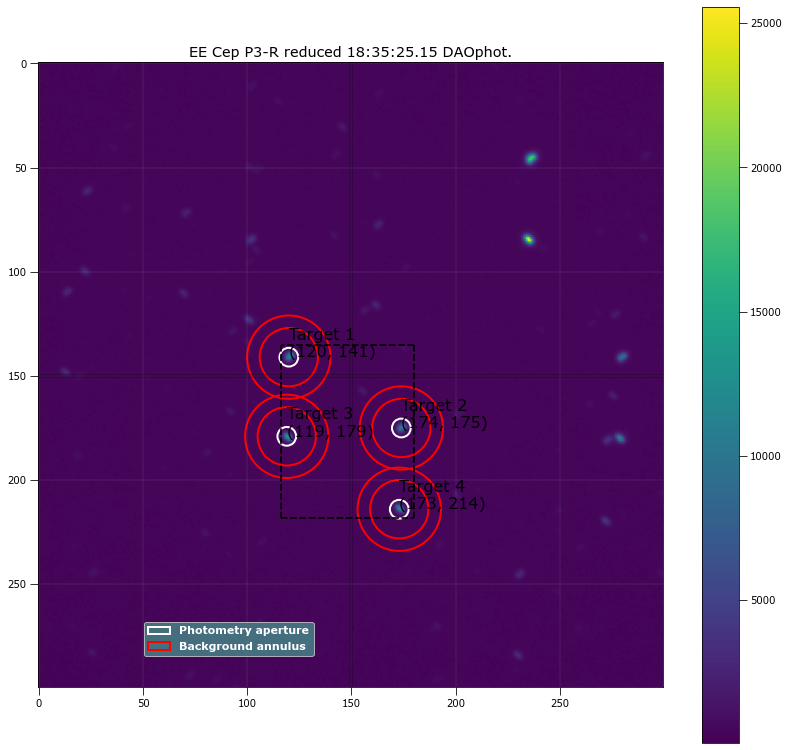

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     120     141 ...          3387.5794      238170.05          946.31155
  2     174     175 ...          3007.8156      235407.88          931.87479
  3     119     179 ...          3529.2331      236021.79          935.68668
  4     173     214 ...          3119.9221      232783.51          921.15819

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     120     141 ...                 3293.9976             171371.14
  2     174     175 ...                 2915.6614             149849.85
  3     119     179 ...          

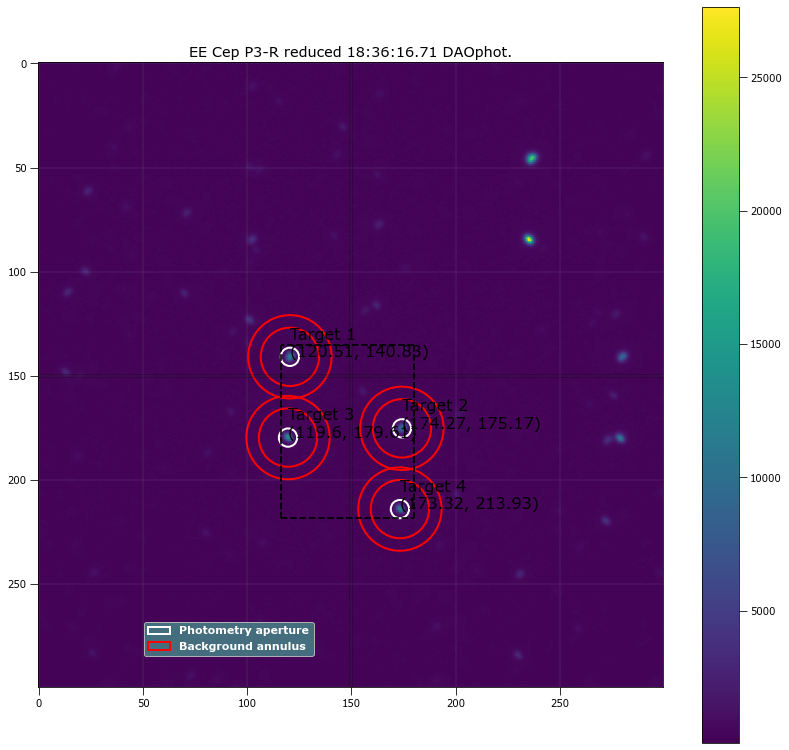

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.50996 140.83298 ...          3434.7731      236931.65          939.80296
  2 174.27369 175.16763 ...          3046.0728       234309.2          927.35105
  3 119.59536 179.60569 ...          3590.7162      236500.15          937.41692
  4 173.31936 213.92528 ...           3169.569      231484.62           916.0458

 Aperture are: 60.54041275365036 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.50996 140.83298 ...                 3345.9957             171064.53
  2 174.27369 175.16763 ...                 2958.4717        

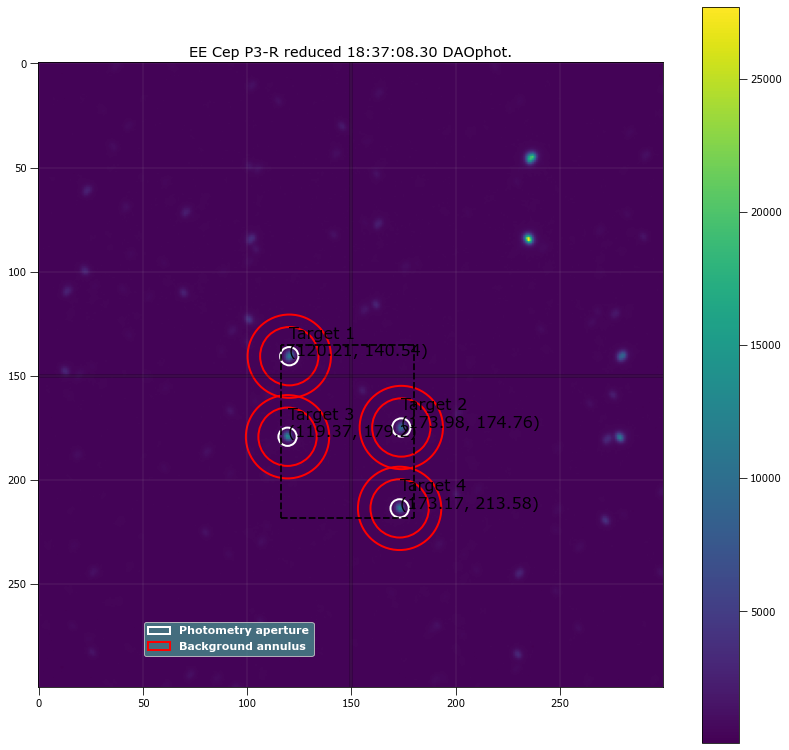

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.20553  140.5371 ...          3286.9129      236743.44          939.11203
  2 173.98337 174.75881 ...          2924.9851      234740.35          929.09158
  3 119.37357 179.20077 ...          3453.6488      235660.17          934.08162
  4 173.17076 213.57887 ...          3088.7918      231021.04          914.25565

 Aperture are: 60.54041275365036 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.20553  140.5371 ...                 3198.2008             168358.45
  2 173.98337 174.75881 ...                 2837.2196        

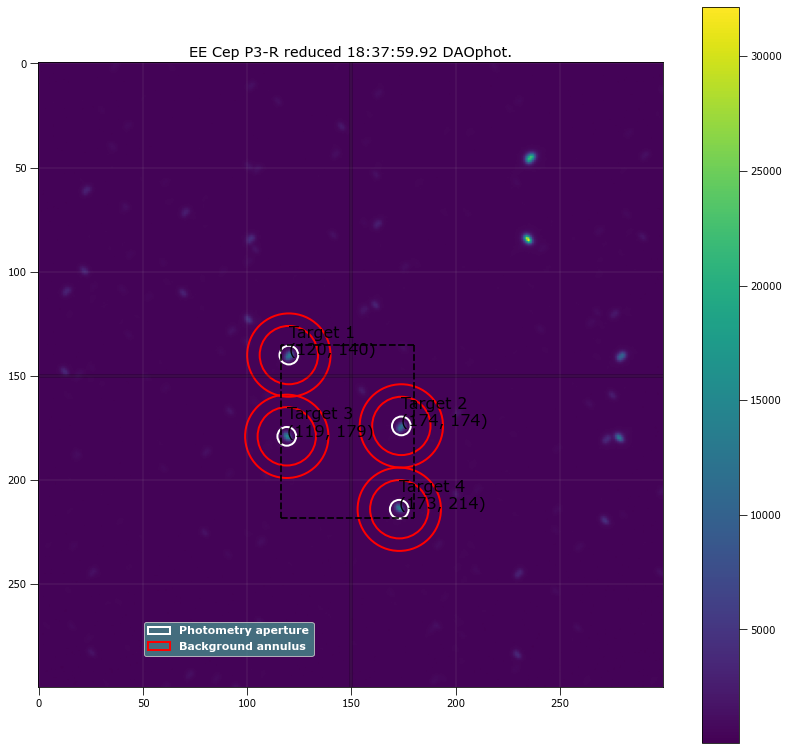

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     120     140 ...          3649.4896      235907.45          935.46992
  2     174     174 ...          3307.3109      233266.92          923.34254
  3     119     179 ...          3803.1258      234669.14          929.71247
  4     173     214 ...          3448.5231      229981.25          910.27986

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     120     140 ...                 3556.9799             174979.97
  2     174     174 ...                 3216.0005             155010.56
  3     119     179 ...          

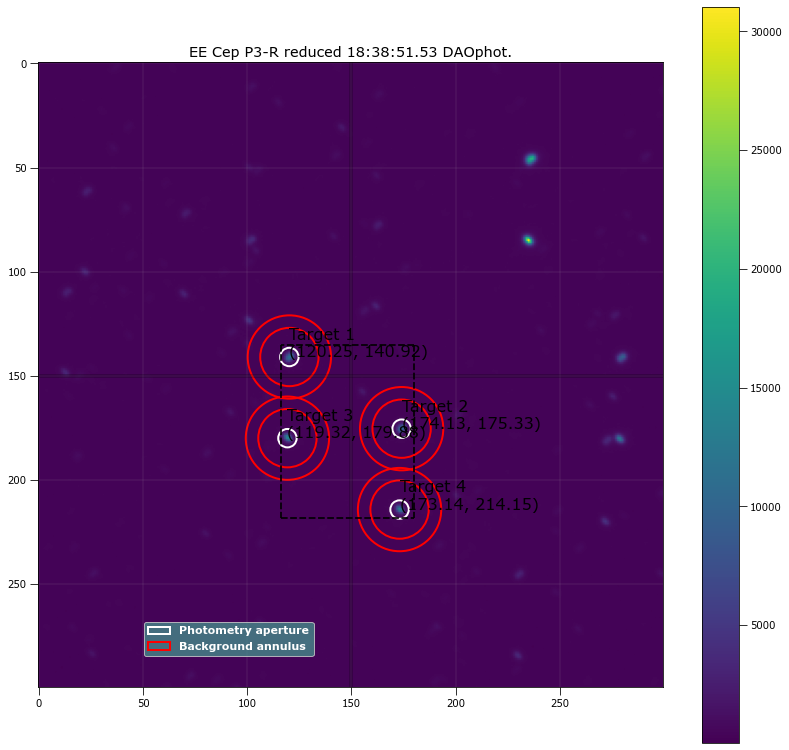

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.24828 140.92246 ...          3387.1434       235702.8          935.37128
  2 174.13094 175.32731 ...          3097.8042      233867.85          925.63562
  3 119.31808 179.88456 ...          3652.4614      234584.13          930.29586
  4 173.14043 214.15439 ...          3289.7803      229535.88          908.48442

 Aperture are: 61.47900981189034 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.24828 140.92246 ...                 3297.4148             170502.83
  2 174.13094 175.32731 ...                 3009.0095        

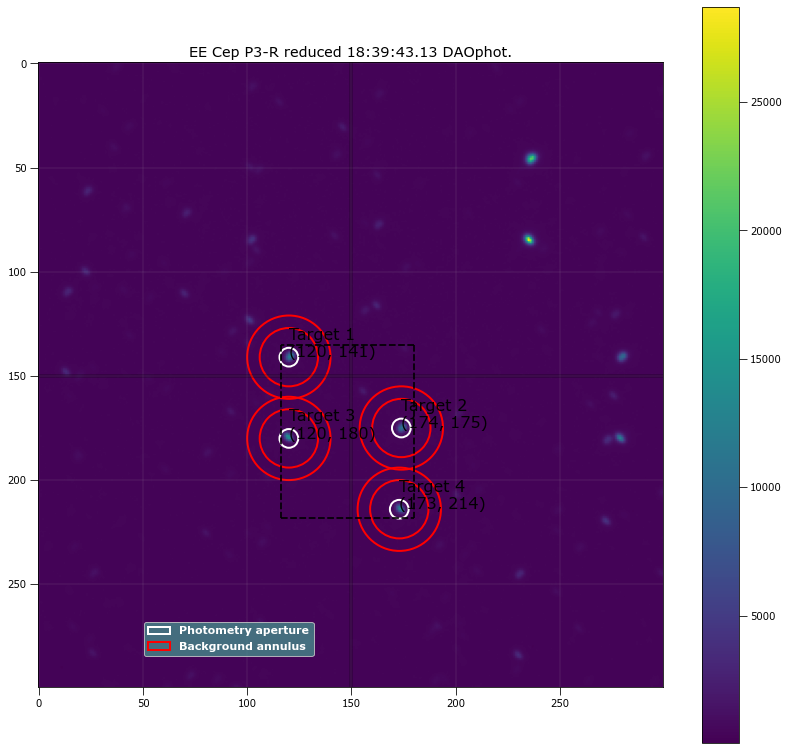

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     120     141 ...           3552.622      237852.06          946.02912
  2     174     175 ...          3165.6115      232979.31          922.14818
  3     120     180 ...          3739.8301      234135.68          928.13839
  4     173     214 ...          3315.2631      229534.15          908.37912

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     120     141 ...                 3459.0681              173254.4
  2     174     175 ...                 3074.4192              154747.3
  3     120     180 ...          

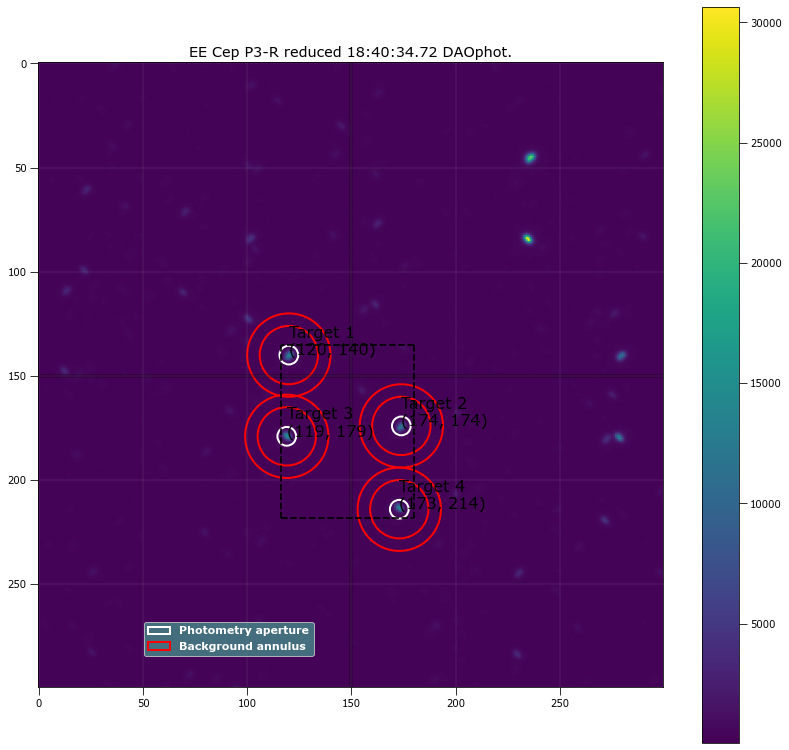

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     120     140 ...          3727.5634      236316.12          937.67241
  2     174     174 ...          3310.5573      234421.34          927.77429
  3     119     179 ...          3847.6733      233575.62           925.5829
  4     173     214 ...          3418.7234      230296.32          911.43269

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     120     140 ...                 3634.8359             176516.71
  2     174     174 ...                 3218.8086             154295.22
  3     119     179 ...          

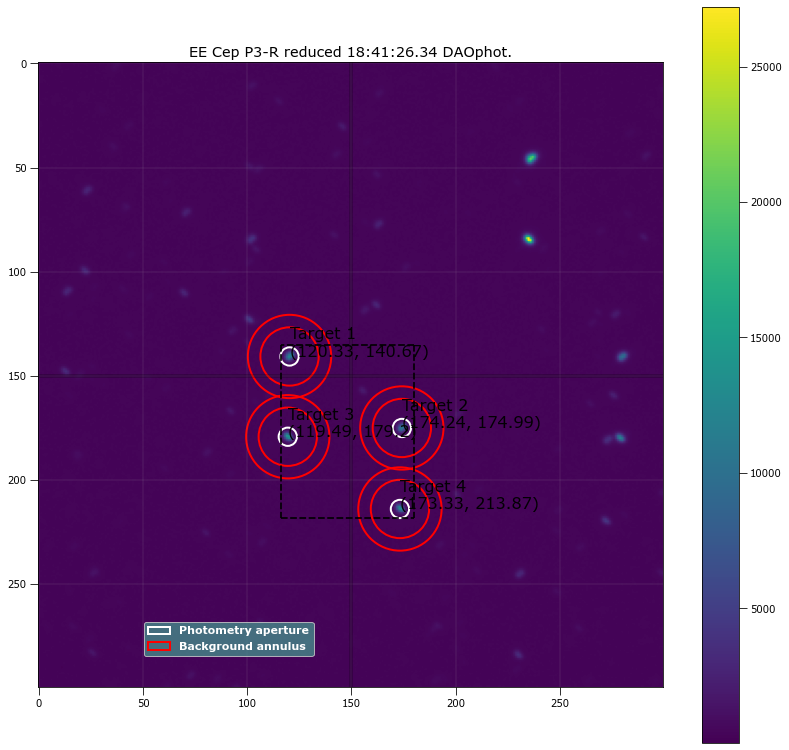

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.32989  140.6661 ...          3510.7593      237349.19          942.06869
  2  174.2396 174.98914 ...          3167.8851      234349.48          927.70353
  3 119.48502 179.19693 ...          3662.6947      235133.43          931.64911
  4 173.32631 213.86986 ...          3328.3846         231211          914.95418

 Aperture are: 60.54041275365036 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.32989  140.6661 ...                  3421.768             172444.07
  2  174.2396 174.98914 ...                 3080.2507        

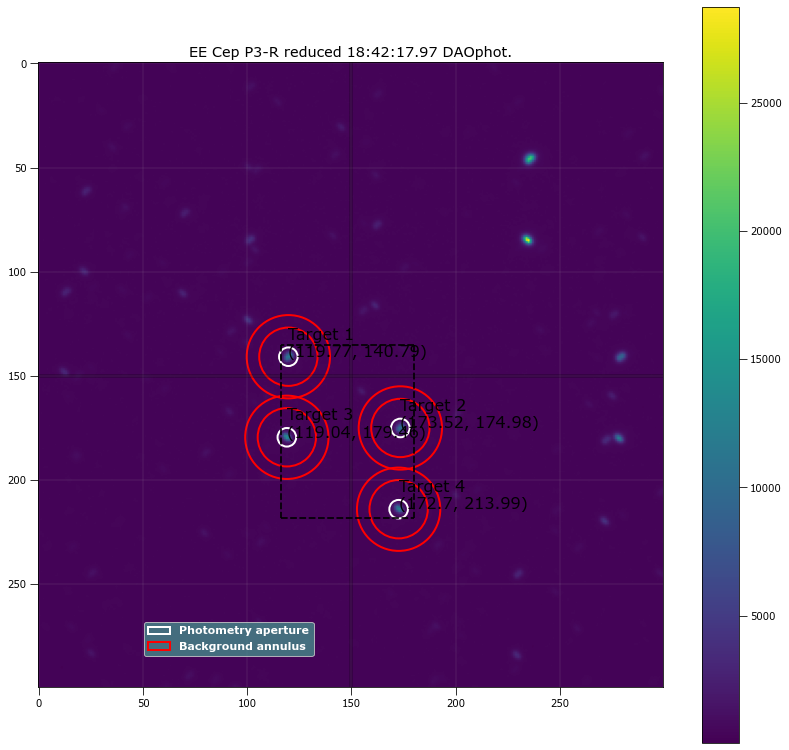

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 119.76832 140.78789 ...          3462.6899      237060.21           940.8634
  2  173.5244 174.98248 ...          3103.6014      233696.21          924.98521
  3 119.03578 179.46118 ...          3635.9895      233914.37          926.55538
  4 172.69541 213.99004 ...          3251.4793      229438.28          908.14662

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 119.76832 140.78789 ...                 3371.0459             172577.93
  2  173.5244 174.98248 ...                  3013.504        

In [38]:
print("P3-R Filter")

res_apt_sum_list = []

start = 35
end = 46
filename = astropy.io.fits.open(target[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(target[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'target 1 x center')
worksheet.write('F1', 'target 1 y center')
worksheet.write('G1', 'target 1 counts')
worksheet.write('H1', 'target 1 error')
worksheet.write('I1', 'target 2 x center')
worksheet.write('J1', 'target 2 y center')
worksheet.write('K1', 'target 2 counts')
worksheet.write('L1', 'target 2 error')
worksheet.write('M1', 'target 3 x center')
worksheet.write('N1', 'target 3 y center')
worksheet.write('O1', 'target 3 counts')
worksheet.write('P1', 'target 3 error')
worksheet.write('Q1', 'target 4 x center')
worksheet.write('R1', 'target 4 y center')
worksheet.write('S1', 'target 4 counts')
worksheet.write('T1', 'target 4 error')
worksheet.write('U1', 'q')
worksheet.write('V1', 'q error')
worksheet.write('W1', 'u')
worksheet.write('X1', 'u error')
worksheet.write('Y1', 'PD')
worksheet.write('Z1', 'PD error')
worksheet.write('AA1', 'PA')
worksheet.write('AB1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [15, 68, 34, 30]

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(3.0, 7, num=60)
    target_a = []
    target_b = []
    target_c = []
    target_d = []
    for radii in trial_radii:
        #Find the position
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          2000, search_off, radii, 14 , 20, False, False)

        if (len(DAO_positions) != 4):
            #Shit is really faint?
            #print("Triggered")
            x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj,3,search_bracket, 1500 , False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False,False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        #print(DAO_positions)
        #Insert Trial
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        target_a.append(phot_tab['residual_aperture_sum'][0])
        target_b.append(phot_tab['residual_aperture_sum'][1])
        target_c.append(phot_tab['residual_aperture_sum'][2])
        target_d.append(phot_tab['residual_aperture_sum'][3])

    combine_target = [target_a, target_b, target_c, target_d]
    
    good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 14 , 20, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3], "\n")
    
    write_this = [k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3]   ]

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

target_1 = []
target_2 = []
target_3 = []
target_4 = []

for things in res_apt_sum_list:
    target_1.append(things[0])
    target_2.append(things[1])
    target_3.append(things[2])
    target_4.append(things[3])

P3-R Filter
Aperture radius for 18:05:38.26 is 4.593220338983051


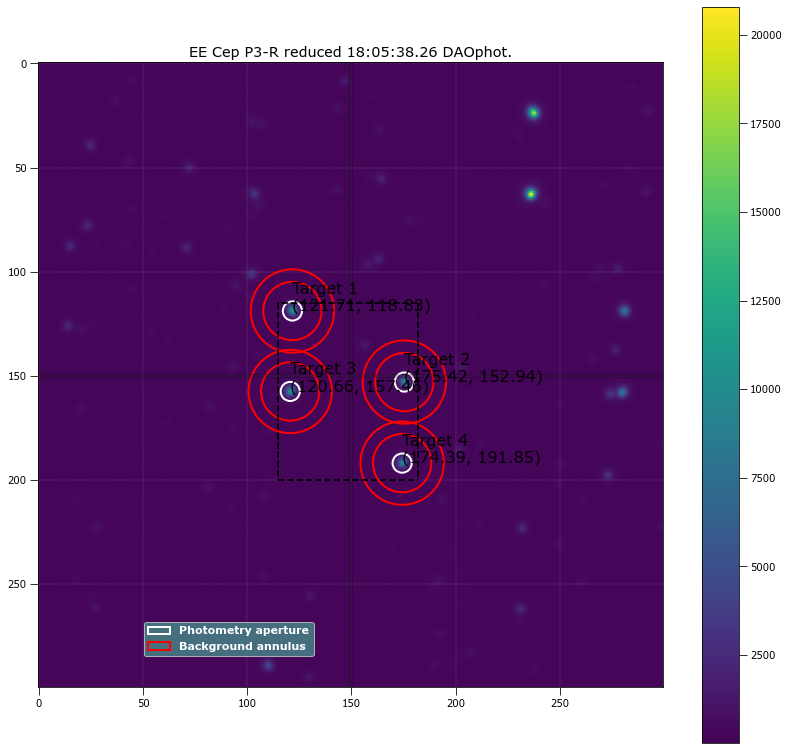

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.70878 118.82704 ...          3339.7885      231427.63          917.37195
  2  175.4221 152.94229 ...          2777.0084      227664.43          901.05408
  3 120.65829 157.45559 ...          3312.0288      230265.98          912.95033
  4 174.38534 191.85088 ...          2767.5462      226067.39          894.53786

 Aperture are: 66.28029476365643 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.70878 118.82704 ...                 3244.9139             190872.86
  2  175.4221 152.94229 ...                 2683.8214        

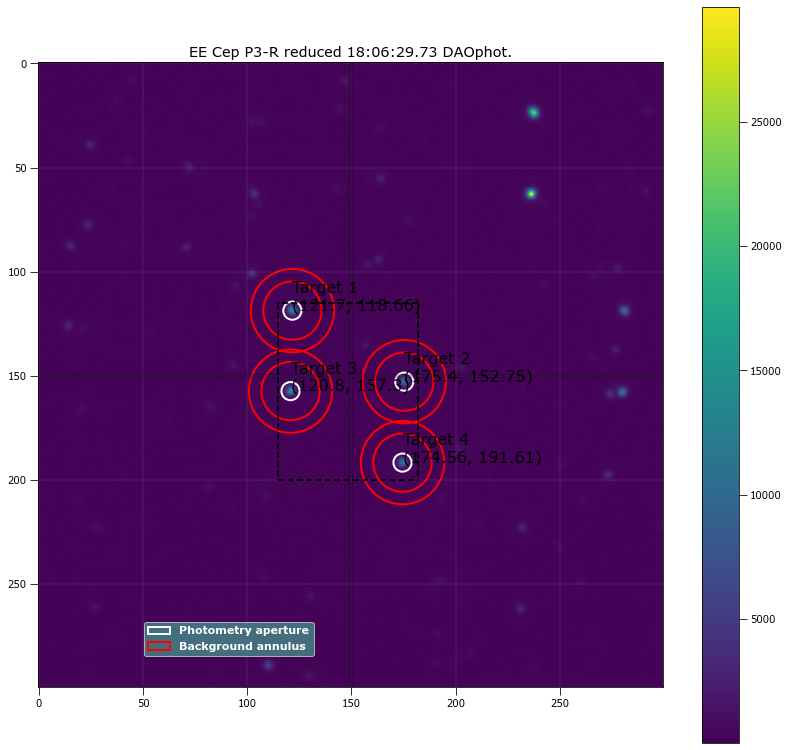

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.69896 118.66345 ...          4076.8167      229532.47          910.81221
  2 175.40212 152.74557 ...          3298.0597      225786.67          893.73921
  3 120.79885  157.2989 ...          4111.2509      228353.94          905.97046
  4 174.56122 191.60653 ...          3331.3652      223779.12          885.80007

 Aperture are: 59.60903567278146 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.69896 118.66345 ...                 3992.1015             206444.82
  2 175.40212 152.74557 ...                 3214.9325        

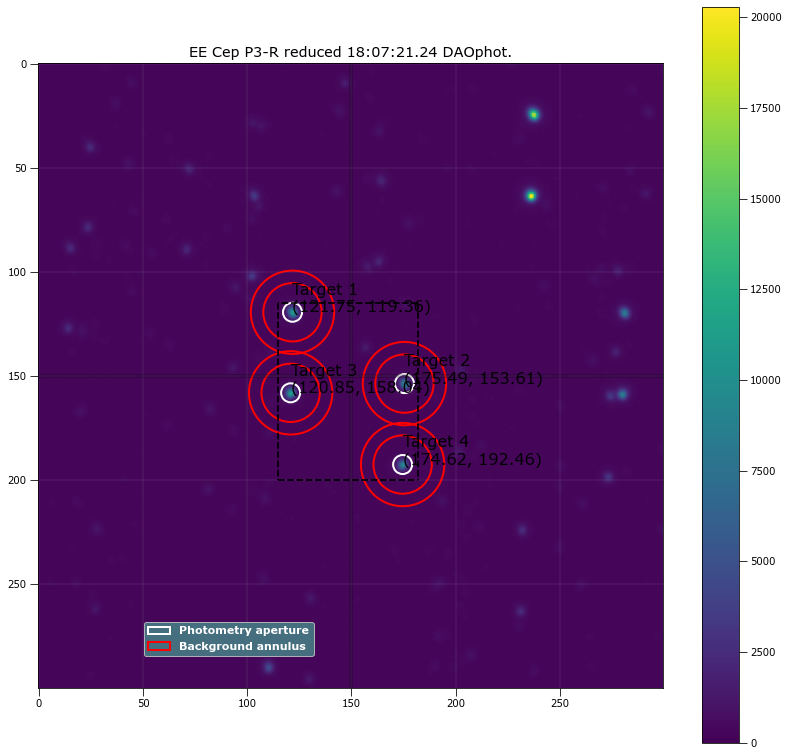

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.74764 119.36345 ...          3522.4375      229456.22          909.76481
  2 175.49339 153.61027 ...          2872.4001      226829.84          897.79962
  3 120.85316 158.03652 ...          3456.7384      229150.44          908.83676
  4   174.616 192.46231 ...          2841.4147       223819.4          885.95907

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.74764 119.36345 ...                 3429.7333              197141.7
  2 175.49339 153.61027 ...                 2780.9152        

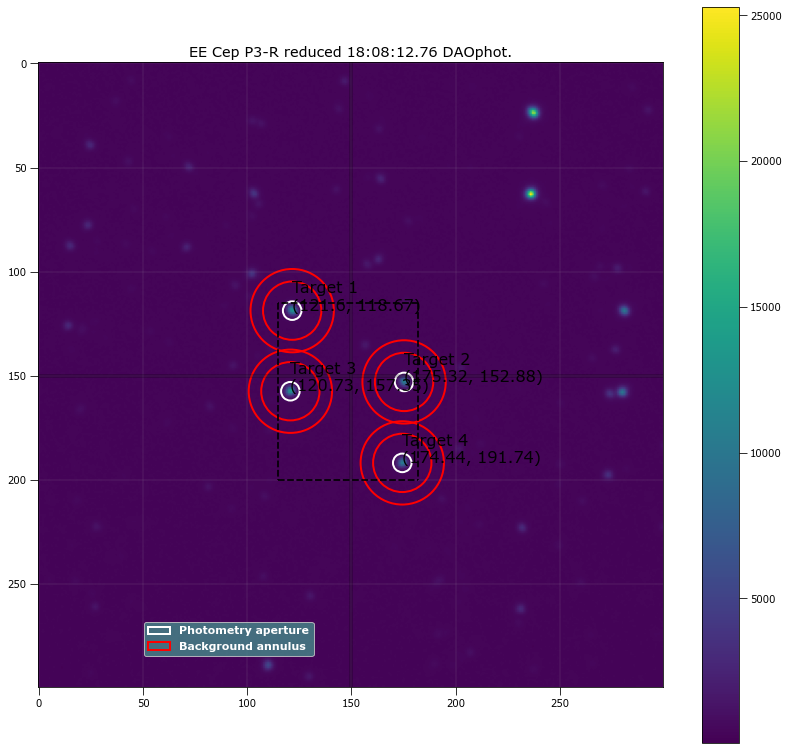

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.60014 118.66847 ...          3794.9359      229574.54          910.68853
  2 175.31507 152.88414 ...          3071.2904      225869.57          894.00758
  3 120.72693 157.35367 ...          3723.9587      227123.38          900.59361
  4 174.44107 191.74381 ...          3026.6516      221985.46          878.69573

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.60014 118.66847 ...                 3706.2311             199451.78
  2 175.31507 152.88414 ...                 2984.2104        

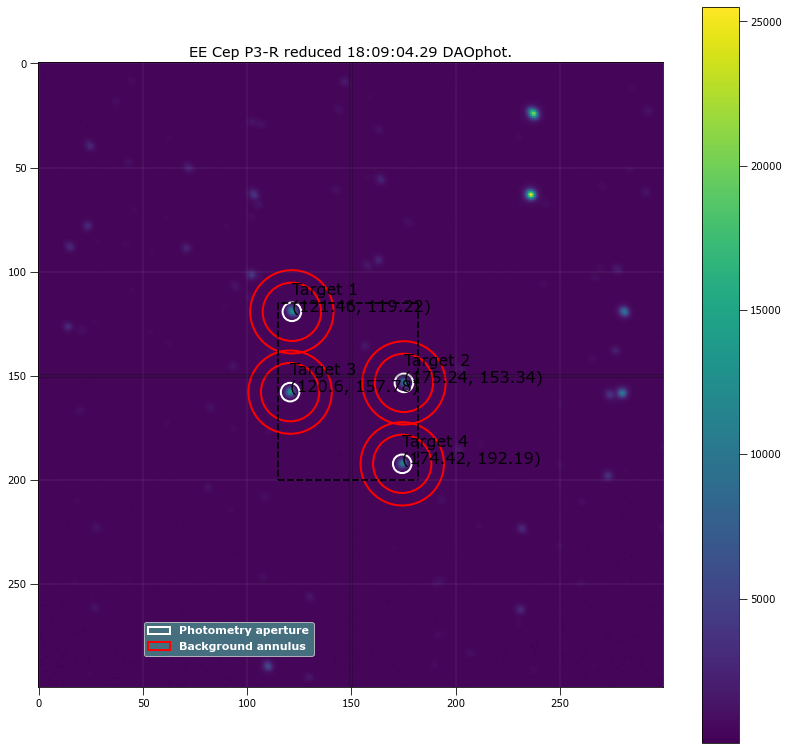

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.45819 119.22233 ...          3766.8641      226226.98          897.58762
  2 175.24237 153.34012 ...          3081.2891      224626.69          889.06855
  3 120.59961 157.78458 ...          3763.9882      225919.61          896.00885
  4 174.41806 192.18927 ...          3079.8441      219969.83          870.76956

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.45819 119.22233 ...                 3679.4353             198998.64
  2 175.24237 153.34012 ...                 2994.6902        

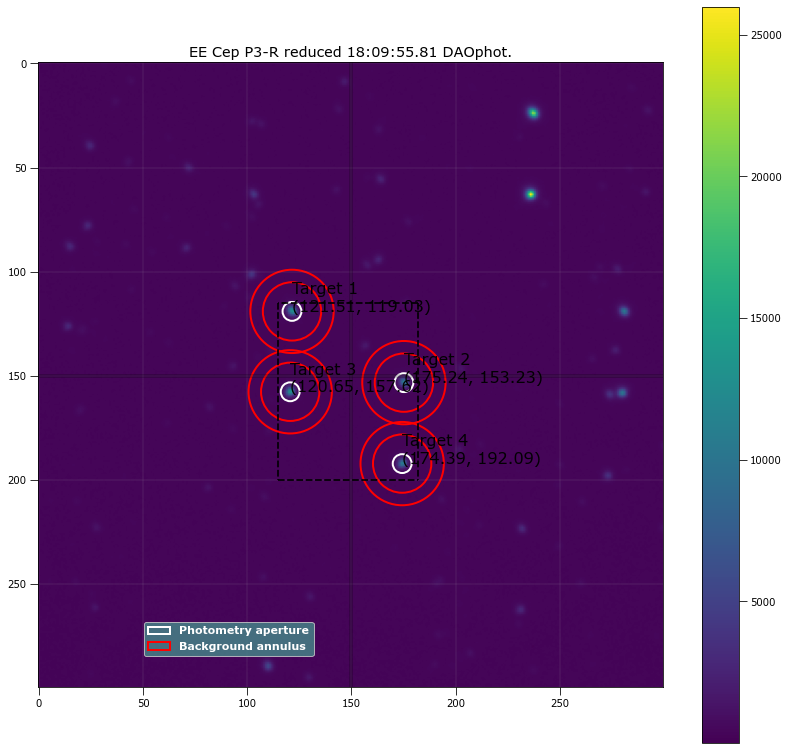

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1  121.5098 119.02591 ...          3716.7891      225196.65          892.90624
  2 175.23631 153.22797 ...          3042.7004      222561.87          881.08315
  3 120.64612 157.61799 ...          3662.6133      224362.65          889.76872
  4  174.3935 192.08706 ...          2999.8916      219420.62          868.50671

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1  121.5098 119.02591 ...                 3627.1507             195776.08
  2 175.23631 153.22797 ...                 2954.2489        

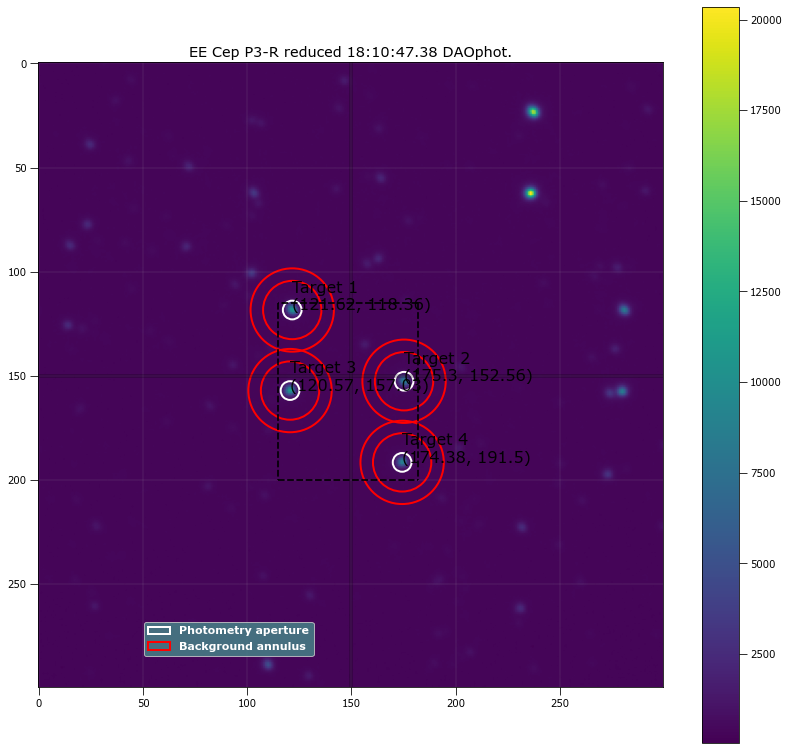

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.62226 118.36257 ...          3464.6462      223807.08          887.41621
  2 175.30306 152.55711 ...          2844.0745      221879.31          878.25749
  3 120.56705 157.03283 ...          3412.8858      223675.62           886.8831
  4 174.37743 191.50295 ...          2800.9816      218312.15          864.27035

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.62226 118.36257 ...                 3376.8885             193191.42
  2 175.30306 152.55711 ...                 2757.2226        

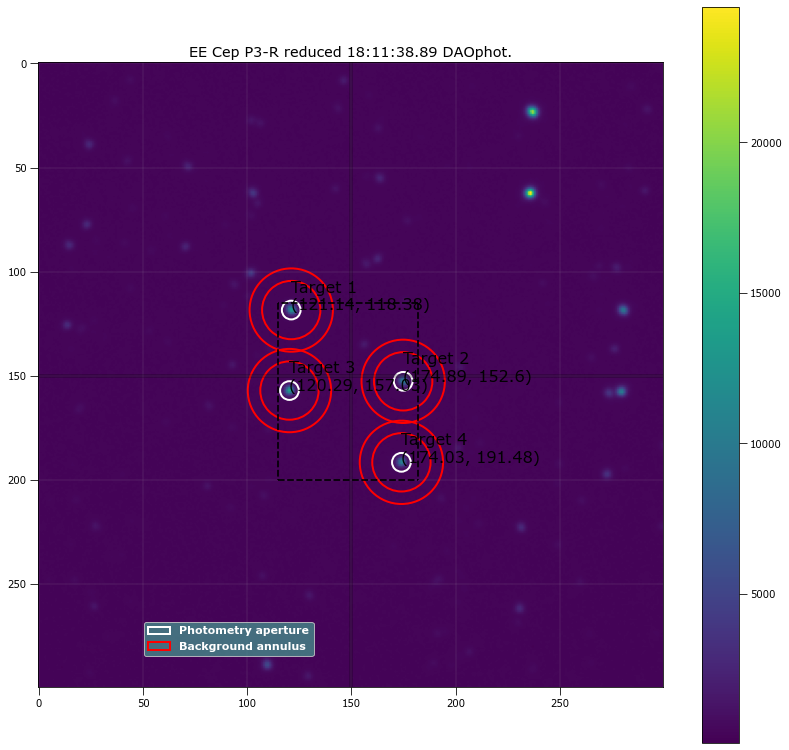

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.14434 118.38431 ...          3800.1356      225145.38          893.06121
  2 174.88608 152.59526 ...          3050.7921      222258.12          879.70801
  3 120.28823 157.02791 ...          3812.6985      224228.99          889.55547
  4 174.03224 191.47552 ...          3066.2315       219560.9           869.1543

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.14434 118.38431 ...                 3711.8197             199447.13
  2 174.88608 152.59526 ...                 2963.7968        

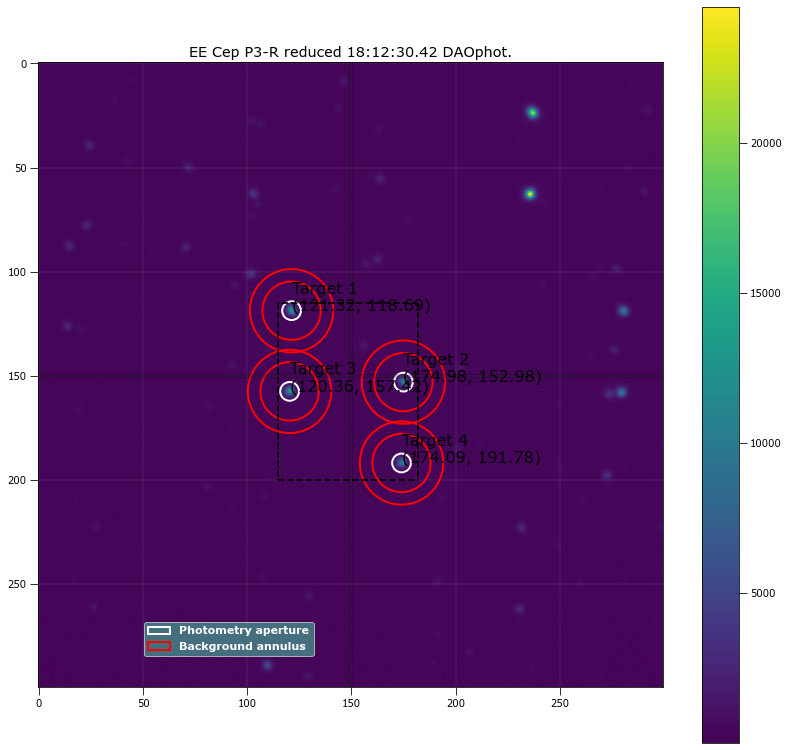

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.31753 118.69367 ...          3748.9309      224590.87          890.53241
  2 174.98419  152.9766 ...          3036.9462      222641.01          881.32562
  3 120.36086 157.42491 ...          3699.1873      224466.38          890.06969
  4 174.09151 191.78481 ...          3008.3989      218638.41           865.4324

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.31753 118.69367 ...                 3660.8651             197938.91
  2 174.98419  152.9766 ...                 2949.7909        

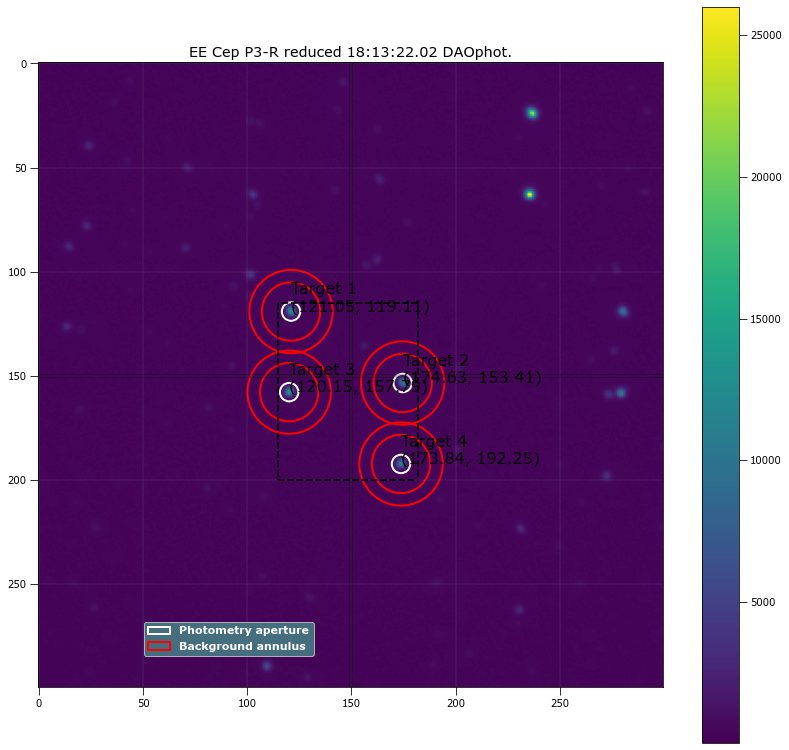

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.05313 119.10982 ...          3836.4357      225158.78          893.07825
  2 174.62918 153.41084 ...          3148.4875      223121.83          883.32658
  3 120.15315 157.79131 ...          3836.2733      224602.78          890.81909
  4 173.83998 192.25475 ...          3145.5873      219141.63          867.41414

 Aperture are: 61.47900981189034 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.05313 119.10982 ...                 3750.7642             198041.56
  2 174.62918 153.41084 ...                 3063.7515        

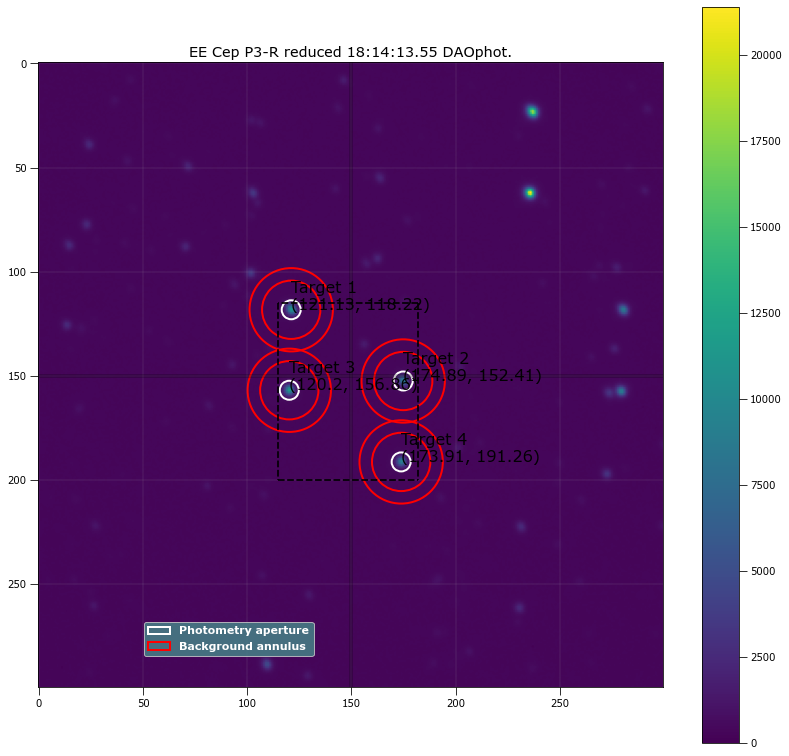

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.13077 118.21866 ...          3452.6838      226690.75          898.99149
  2  174.8921 152.41334 ...          2806.8131      222832.16          882.01687
  3 120.20321 156.86123 ...          3434.4987      225589.03          894.23167
  4 173.91207   191.255 ...          2803.4029      220640.35          873.12164

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.13077 118.21866 ...                 3361.0774             191393.71
  2  174.8921 152.41334 ...                 2716.9364        

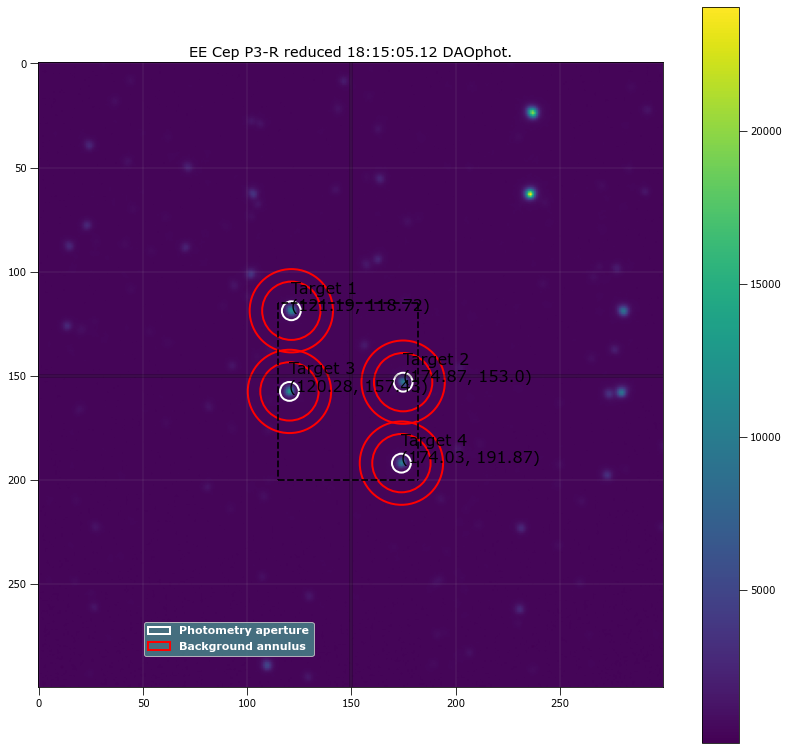

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.18558 118.72338 ...          3608.9244       224542.5          890.52938
  2 174.86601  152.9968 ...          2928.1608      222137.87          879.29592
  3 120.28372 157.43136 ...          3593.3241      224199.54          889.35819
  4 174.03392 191.86932 ...          2900.7735      219471.81          868.72288

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.18558 118.72338 ...                 3519.5246             193627.64
  2 174.86601  152.9968 ...                 2839.8888        

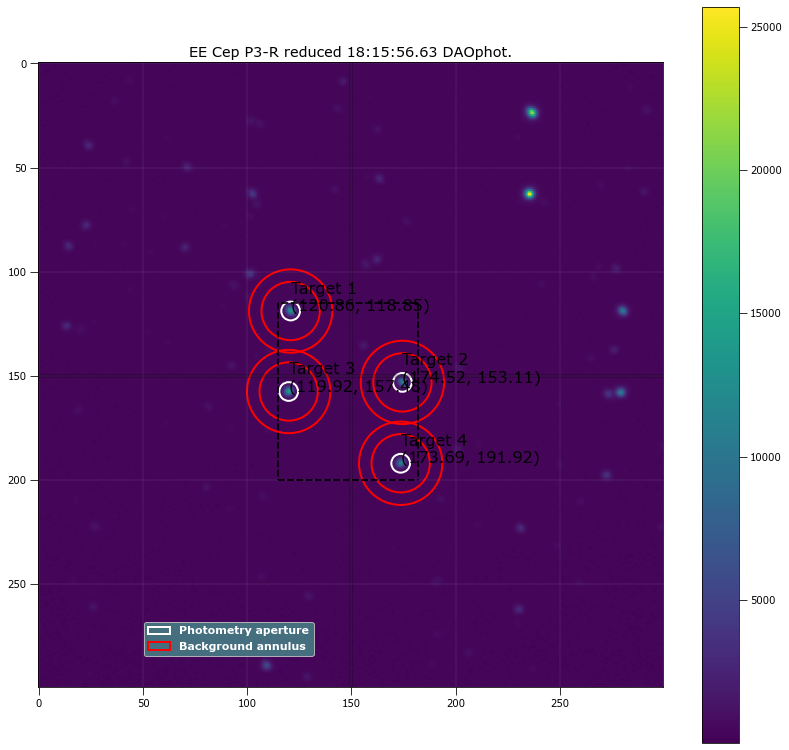

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.85877  118.8507 ...          3830.6024      227124.68          900.45141
  2  174.5158 153.10884 ...          3073.5887      223866.38           886.0588
  3 119.92164 157.47909 ...          3817.4452      225804.76           895.5296
  4 173.68531 191.92469 ...          3055.0212       219995.6          870.81087

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.85877  118.8507 ...                 3741.5557             198228.24
  2  174.5158 153.10884 ...                 2985.9653        

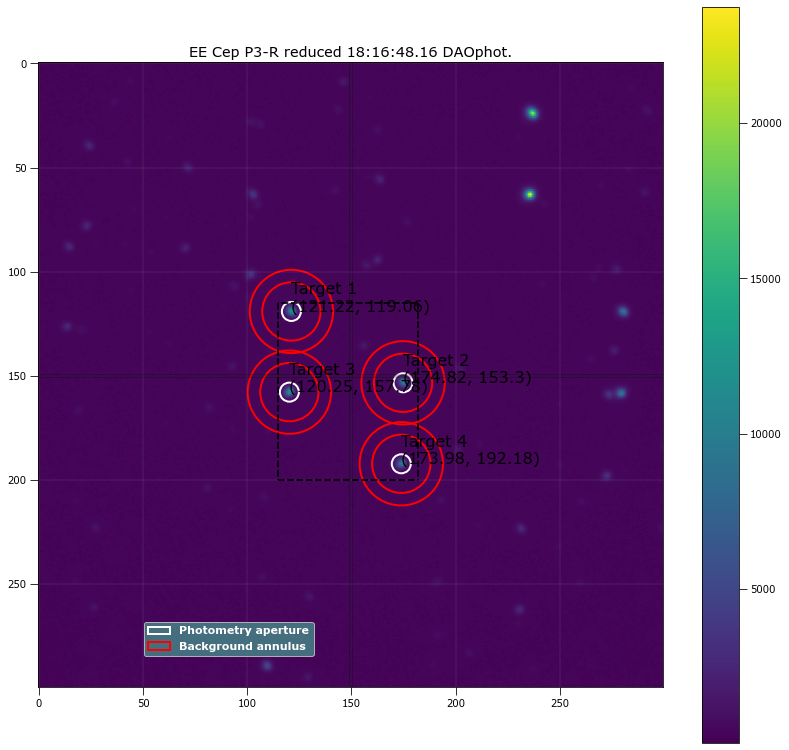

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.21921 119.06104 ...          3552.4415      228642.35          906.09498
  2 174.82473 153.30345 ...          2869.6214      226818.94          897.68966
  3 120.24952 157.78121 ...          3491.6974      228061.21          903.95812
  4 173.97847 192.17717 ...          2816.1487       223781.3          885.66261

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.21921 119.06104 ...                 3460.1112             188797.84
  2 174.82473 153.30345 ...                 2778.1477        

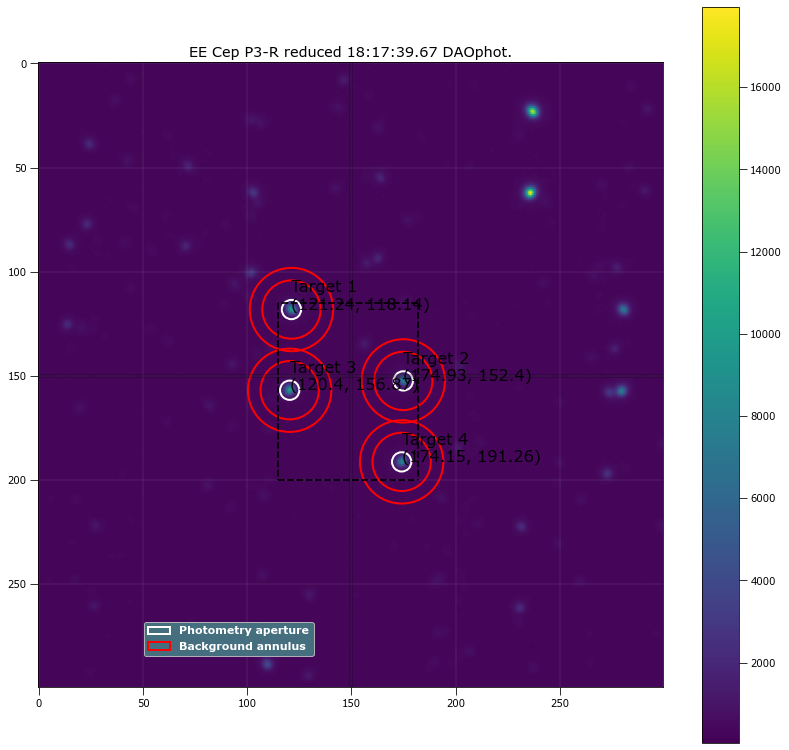

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.24432 118.14009 ...          3129.8966      232199.19          920.68268
  2 174.92791 152.39784 ...          2579.3064      228984.36          906.11746
  3 120.40148 156.87332 ...           3071.657      231103.62          915.82683
  4 174.15222 191.25952 ...          2548.5614       225877.2          894.07692

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.24432 118.14009 ...                  3033.269              179006.3
  2 174.92791 152.39784 ...                 2484.2075        

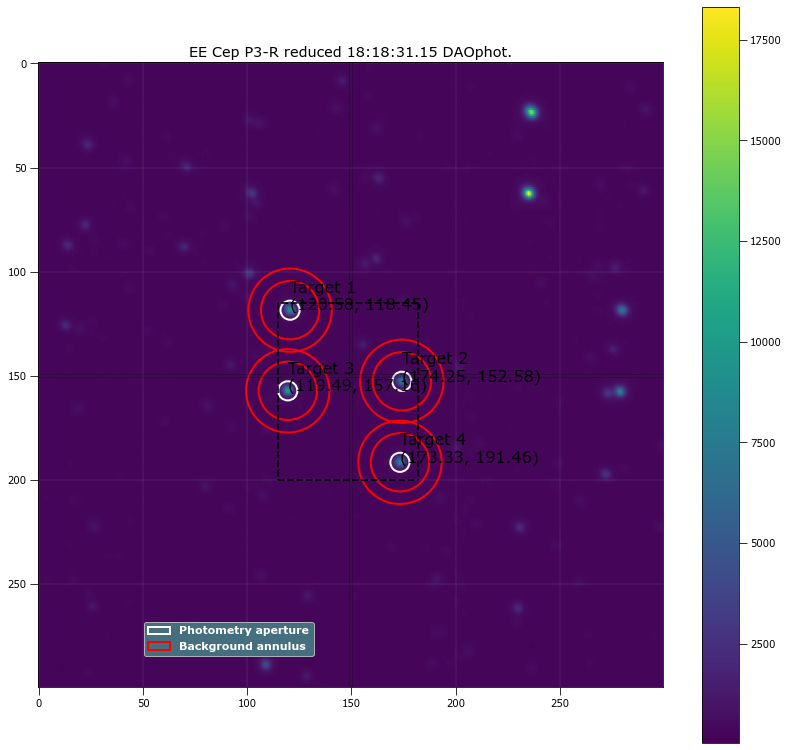

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.58231  118.4487 ...          3166.9778      231425.07          917.41073
  2 174.24587 152.58302 ...          2634.5734      229226.96          907.18673
  3 119.49283 157.15658 ...          3184.6461      231436.05          917.57864
  4 173.32971 191.46463 ...          2661.6219      226338.45          895.66784

 Aperture are: 66.28029476365643 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.58231  118.4487 ...                 3072.0992             182083.63
  2 174.24587 152.58302 ...                 2540.7521        

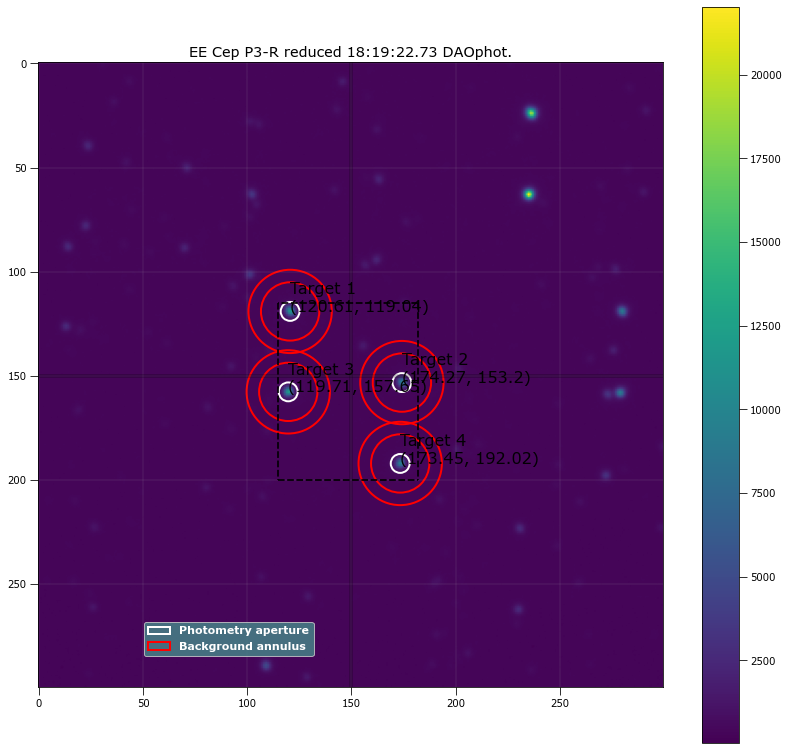

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.61076 119.03996 ...          3437.3796      233043.98          923.88374
  2 174.27168 153.20171 ...          2819.3538      230142.14          910.84063
  3 119.71096 157.65312 ...          3422.8797      231628.53          918.23666
  4 173.44858 192.01988 ...          2800.7592      226244.35          895.43448

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.61076 119.03996 ...                 3344.6314             185659.39
  2 174.27168 153.20171 ...                  2727.915        

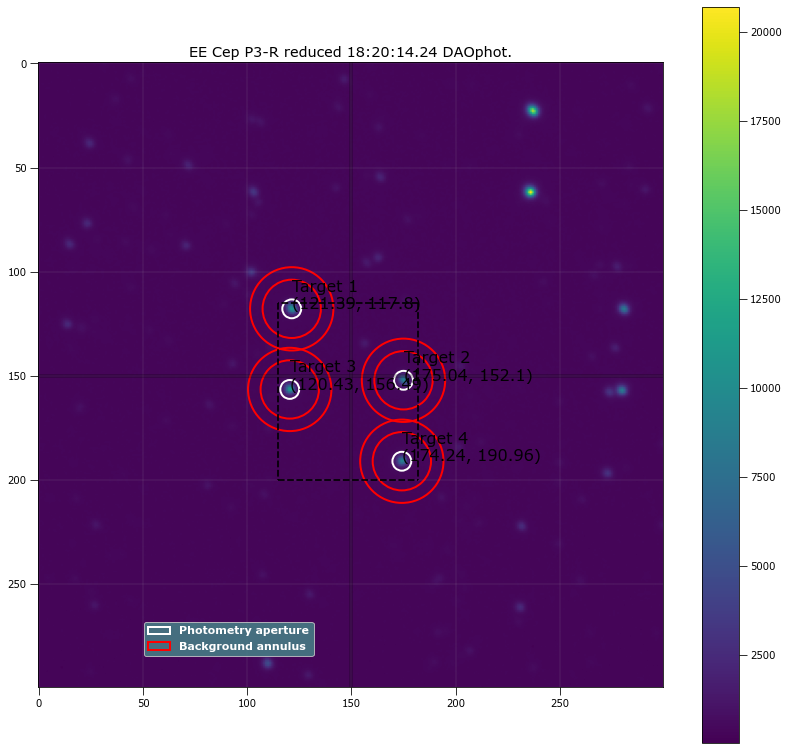

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.38529 117.80032 ...           3391.685      232844.34          923.10943
  2 175.03667 152.09699 ...          2753.5078       229735.2          909.18547
  3 120.42875 156.48628 ...          3351.3413      231885.78           919.0616
  4 174.23848 190.95544 ...          2706.4445      225427.22          892.19263

 Aperture are: 64.33812085083675 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.38529 117.80032 ...                 3299.0145             186000.13
  2 175.03667 152.09699 ...                 2662.2351        

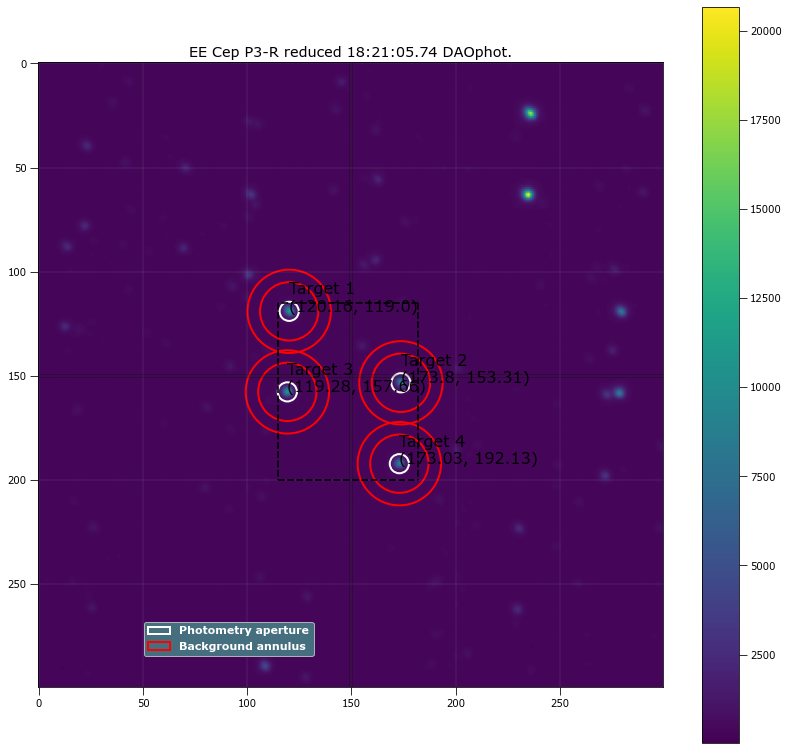

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 120.16053 118.99685 ...           3278.594      231344.39          917.24225
  2 173.79598 153.30651 ...          2704.2419      229280.17          907.50186
  3 119.27825 157.65842 ...          3241.1563      230685.48          914.26224
  4 173.03313 192.13194 ...          2682.0167      225190.22          891.39304

 Aperture are: 66.28029476365643 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 120.16053 118.99685 ...                 3183.7328              180904.5
  2 173.79598 153.30651 ...                 2610.3881        

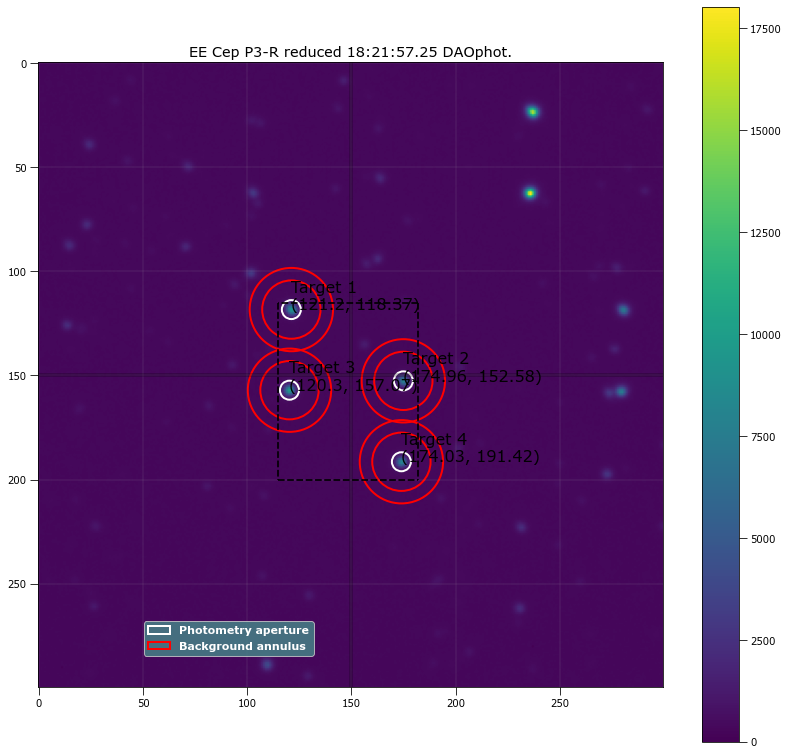

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 121.20146 118.37174 ...            3154.43      230069.85          912.28148
  2 174.96339 152.57827 ...          2576.4162      226299.02          895.57574
  3 120.30255  157.0693 ...          3139.8857      228777.07           907.0382
  4  174.0283 191.41747 ...          2603.7308      224142.11          887.04528

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 121.20146 118.37174 ...                 3061.4693             181632.45
  2 174.96339 152.57827 ...                 2485.1578        

In [20]:
print("P3-R Filter")

res_apt_sum_list = []

start = 39
end = 59
filename = astropy.io.fits.open(target[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(target[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'target 1 x center')
worksheet.write('F1', 'target 1 y center')
worksheet.write('G1', 'target 1 counts')
worksheet.write('H1', 'target 1 error')
worksheet.write('I1', 'target 2 x center')
worksheet.write('J1', 'target 2 y center')
worksheet.write('K1', 'target 2 counts')
worksheet.write('L1', 'target 2 error')
worksheet.write('M1', 'target 3 x center')
worksheet.write('N1', 'target 3 y center')
worksheet.write('O1', 'target 3 counts')
worksheet.write('P1', 'target 3 error')
worksheet.write('Q1', 'target 4 x center')
worksheet.write('R1', 'target 4 y center')
worksheet.write('S1', 'target 4 counts')
worksheet.write('T1', 'target 4 error')
worksheet.write('U1', 'q')
worksheet.write('V1', 'q error')
worksheet.write('W1', 'u')
worksheet.write('X1', 'u error')
worksheet.write('Y1', 'PD')
worksheet.write('Z1', 'PD error')
worksheet.write('AA1', 'PA')
worksheet.write('AB1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [35, 50, 35, 32]

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(3.0, 7, num=60)
    target_a = []
    target_b = []
    target_c = []
    target_d = []
    for radii in trial_radii:
        #Find the position
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          2000, search_off, radii, 14 , 20, False, False)

        if (len(DAO_positions) != 4):
            #Shit is really faint?
            #print("Triggered")
            x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj,3,search_bracket, 1500 , False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False,False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        #print(DAO_positions)
        #Insert Trial
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        target_a.append(phot_tab['residual_aperture_sum'][0])
        target_b.append(phot_tab['residual_aperture_sum'][1])
        target_c.append(phot_tab['residual_aperture_sum'][2])
        target_d.append(phot_tab['residual_aperture_sum'][3])

    combine_target = [target_a, target_b, target_c, target_d]
    
    good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 14 , 20, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3], "\n")
    
    write_this = [k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3]   ]

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

target_1 = []
target_2 = []
target_3 = []
target_4 = []

for things in res_apt_sum_list:
    target_1.append(things[0])
    target_2.append(things[1])
    target_3.append(things[2])
    target_4.append(things[3])